In [50]:
import cv2
import os

def split_video_into_frames(video_path, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Check if the video file was opened correctly
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    # Get the frame rate (fps) of the video
    fps = cap.get(cv2.CAP_PROP_FPS)

    frame_count = 0
    frame_interval = int(fps)  # Capture 1 frame per second

    while True:
        # Set the position to the next frame at the interval
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count * frame_interval)

        # Read a frame from the video
        ret, frame = cap.read()

        # If the frame was successfully read
        if ret:
            # Generate filename for the frame
            frame_filename = os.path.join(output_folder, f"frame_pbm_{frame_count:04d}.png")

            # Save the frame as an image
            cv2.imwrite(frame_filename, frame)

            # Print frame number
            print(f"Frame {frame_count} saved as {frame_filename}")

            # Increment frame count
            frame_count += 1
        else:
            # End of the video, break the loop
            break

    # Release the video capture object
    cap.release()
    print(f"Video split into {frame_count} frames.")

# Example usage
video_path = "/Users/neelkolhe/Desktop/pbm.mp4"  # Replace with your video file path
output_folder = "/Users/neelkolhe/Downloads/theoffice"  # Folder to save the frames

split_video_into_frames(video_path, output_folder)

Frame 0 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0000.png
Frame 1 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0001.png
Frame 2 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0002.png
Frame 3 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0003.png
Frame 4 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0004.png
Frame 5 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0005.png
Frame 6 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0006.png
Frame 7 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0007.png
Frame 8 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0008.png
Frame 9 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0009.png
Frame 10 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0010.png
Frame 11 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0011.png
Frame 12 saved as /Users/neelkolhe/Downloads/theoffice/frame_pbm_0012.png
Frame 13 saved as /Users/neelkolhe/Downloads/the

In [3]:
%pip install torch torchvision
%pip install -r requirements.txt
%pip install retina-face
%pip install tf-keras
%pip install deepface
%pip install ultralytics opencv-python pydub numpy scipy 

%pip install torch torchvision torchaudio
%pip install timm


Note: you may need to restart the kernel to use updated packages.
  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached cachetools-5.5.0-py3-none-any.whl.metadata (5.3 kB)
  Using cached filelock-3.16.1-py3-none-any.whl.metadata (2.9 kB)
  Using cached Flask_Cors-5.0.0-py2.py3-none-any.whl.metadata (5.5 kB)
  Using cached fsspec-2024.12.0-py3-none-any.whl.metadata (11 kB)
  Using cached h5py-3.12.1-cp39-cp39-macosx_11_0_arm64.whl.metadata (2.5 kB)
  Using cached keras-3.8.0-py3-none-any.whl.metadata (5.8 kB)
  Using cached llvmlite-0.43.0-cp39-cp39-macosx_11_0_arm64.whl.metadata (4.8 kB)
  Using cached Markdown-3.7-py3-none-any.whl.metadata (7.0 kB)
  Using cached ml_dtypes-0.4.1-cp39-cp39-macosx_10_9_universal2.whl.metadata (20 kB)
  Using cached more_itertools-10.6.0-py3-none-any.whl.metadata (37 kB)
  Using cached numba-0.60.0-cp39-cp39-macosx_11_0_arm64.whl.metadata (2.7 kB)
  Using cached openai_whisper-20240930-py3-none-any.whl
  Using cached opencv_pytho

In [51]:
import torch
from PIL import Image, ImageDraw, ImageFont
from torchvision import transforms
import numpy as np
from retinaface import RetinaFace
from deepface import DeepFace
from scipy.spatial.distance import cosine
import cv2
import matplotlib.pyplot as plt
import os
from io import BytesIO
import json

# Define transform for gaze detection model
transform = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
])

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Threshold for considering faces across frames to be the same person
EMBEDDING_THRESHOLD = 0.6  # Adjust based on your needs

# Custom JSON encoder to handle NumPy types
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NumpyEncoder, self).default(obj)

def load_known_faces(image_paths):
    """
    Load known faces and generate embeddings using RetinaFace for detection.
    :param image_paths: Dictionary of {name: image_path} pairs.
    :return: Dictionary of {name: embedding} pairs.
    """
    known_faces = {}
    for name, image_path in image_paths.items():
        try:
            # Load the image
            face_image = cv2.imread(image_path)
            if face_image is None:
                print(f"Could not load image for {name} at {image_path}")
                continue
                
            # Detect faces using RetinaFace instead of OpenCV's Haar cascade
            resp = RetinaFace.detect_faces(face_image)
            if resp:
                # Get the first face's bounding box
                bbox = resp['face_1']['facial_area']
                x1, y1, x2, y2 = bbox
                
                # Extract face ROI
                face_roi = face_image[y1:y2, x1:x2]
                
                # Generate embedding using 'skip' as detector_backend
                embedding = DeepFace.represent(face_roi, model_name='Facenet512',
                                              detector_backend='skip',
                                              enforce_detection=False)
                                              
                known_faces[name] = np.array(embedding[0]['embedding'])
                print(f"Successfully loaded face for {name}")
            else:
                print(f"No face detected for {name} in {image_path}")
        except Exception as e:
            print(f"Error loading face for {name}: {e}")
            
    return known_faces

def match_known_face(face_embedding, known_faces):
    """
    Match a detected face embedding to the most similar known face.
    :param face_embedding: The embedding of the detected face.
    :param known_faces: Dictionary of {name: embedding} pairs.
    :return: Name of the most similar face and the similarity score.
    """
    best_match = None
    best_score = float('inf')  # Lower distance is better
    
    for name, known_embedding in known_faces.items():
        distance = cosine(known_embedding, face_embedding)
        if distance < best_score:
            best_score = distance
            best_match = name
            
    return best_match, best_score

def get_face_embedding(face_roi):
    """Generate an embedding for the given face ROI."""
    try:
        # Since we already have the face ROI, skip the detection step
        embedding = DeepFace.represent(face_roi, model_name='Facenet512',
                                      detector_backend='skip',
                                      enforce_detection=False)
        return np.array(embedding[0]['embedding'])
    except Exception as e:
        print(f"Embedding error: {e}")
        return None

def analyze_emotions(face_roi):
    """Analyze emotions using DeepFace."""
    try:
        result = DeepFace.analyze(face_roi, actions=['emotion'],
                                 detector_backend='skip',
                                 enforce_detection=False)
        return result[0]['dominant_emotion']
    except Exception as e:
        print(f"Emotion analysis error: {e}")
        return "Unknown"

def visualize_all(pil_image, heatmaps, bboxes, inout_scores=None, emotions=None, names=None, inout_thresh=0.5):
    """
    Create a visualization with bounding boxes, gaze points, and labels.
    :param pil_image: PIL Image to visualize on
    :param heatmaps: Tensor of heatmaps for each face
    :param bboxes: List of bounding boxes for each face
    :param inout_scores: List of in-frame scores for each face (optional)
    :param emotions: List of emotions for each face (optional)
    :param names: List of names for each face (optional)
    :param inout_thresh: Threshold for considering gaze to be in-frame
    :return: PIL Image with visualization
    """
    print("Names passed to visualize_all:", names)
    colors = ['lime', 'tomato', 'cyan', 'fuchsia', 'yellow']
    
    # Create a new image with extra space at the top for headers
    width, height = pil_image.size
    header_height = 100  # Adjustable based on your preference
    
    # Create a new image with white background for the header area
    new_image = Image.new("RGBA", (width, height + header_height), (255, 255, 255, 255))
    new_image.paste(pil_image, (0, header_height))
    
    # Convert to RGBA for drawing
    overlay_image = new_image.convert("RGBA")
    draw = ImageDraw.Draw(overlay_image)
    
    # Draw header area with a light gray background
    draw.rectangle([0, 0, width, header_height], fill=(240, 240, 240, 255))
    
    # Draw a line to separate header from image
    draw.line([(0, header_height), (width, header_height)], fill=(100, 100, 100, 255), width=2)
    
    # Prepare to write the face information in the header
    header_text = []
    
    for i in range(len(bboxes)):
        # Get bounding box
        bbox = bboxes[i]
        xmin, ymin, xmax, ymax = bbox
        
        # Convert normalized coordinates to pixel coordinates (adjusted for header)
        xmin_px, ymin_px = xmin * width, ymin * height + header_height
        xmax_px, ymax_px = xmax * width, ymax * height + header_height
        
        # Select color for this face
        color = colors[i % len(colors)]
        
        # Draw bounding box
        line_width = max(1, int(min(width, height) * 0.01))
        draw.rectangle([xmin_px, ymin_px, xmax_px, ymax_px], outline=color, width=line_width)
        
        # Prepare label text
        person_info = []
        if names is not None and i < len(names):
            person_info.append(f"{names[i]}")  # Just use the actual name
        else:
            person_info.append(f"Person {i+1}")
            
        if emotions is not None and i < len(emotions):
            person_info.append(f"Emotion: {emotions[i]}")
            
        if inout_scores is not None and i < len(inout_scores):
            if torch.is_tensor(inout_scores[i]):
                score_value = inout_scores[i].item()
            else:
                score_value = float(inout_scores[i])
                
            looking_at = "Looking at camera" if score_value > inout_thresh else "Not looking at camera"
            person_info.append(f"{looking_at} ({score_value:.2f})")
            
        # Add this face's info to the header text
        header_text.append((person_info, color))
        
        # Draw gaze direction if available and in-frame score is above threshold
        if heatmaps is not None and i < len(heatmaps):
            should_draw_gaze = True
            if inout_scores is not None and i < len(inout_scores):
                if torch.is_tensor(inout_scores[i]):
                    inout_value = inout_scores[i].item()
                else:
                    inout_value = float(inout_scores[i])
                should_draw_gaze = inout_value > inout_thresh
                
            if should_draw_gaze:
                # Convert heatmap to numpy if it's a tensor
                if torch.is_tensor(heatmaps[i]):
                    heatmap_np = heatmaps[i].detach().cpu().numpy()
                else:
                    heatmap_np = heatmaps[i]
                    
                # Find max activation point in heatmap
                max_index = np.unravel_index(np.argmax(heatmap_np), heatmap_np.shape)
                gaze_target_y, gaze_target_x = max_index  # Heatmap indices are (y, x)
                
                # Convert heatmap indices to image coordinates
                gaze_target_x = gaze_target_x / heatmap_np.shape[1] * width
                gaze_target_y = gaze_target_y / heatmap_np.shape[0] * height + header_height
                
                # Calculate center of bounding box
                bbox_center_x = ((xmin + xmax) / 2) * width
                bbox_center_y = ((ymin + ymax) / 2) * height + header_height
                
                # Draw gaze point
                point_radius = max(1, int(min(width, height) * 0.01))
                draw.ellipse([(gaze_target_x-point_radius, gaze_target_y-point_radius),
                            (gaze_target_x+point_radius, gaze_target_y+point_radius)],
                            fill=color)
                            
                # Draw line from face to gaze point
                line_width = max(1, int(min(width, height) * 0.005))
                draw.line([(bbox_center_x, bbox_center_y), (gaze_target_x, gaze_target_y)],
                        fill=color, width=line_width)
    
    # Draw the header information
    try:
        # Try to load a better font
        font_size = 24
        try:
            font = ImageFont.truetype("Arial", font_size)
        except:
            # If Arial not available, try system default font
            font = ImageFont.load_default()
    except:
        # If loading default font fails, proceed without a font
        font = None
        
    # Draw the header text
    y_offset = 10
    for i, (person_info, color) in enumerate(header_text):
        # Draw a color box to match the bounding box color
        color_box_size = 15
        draw.rectangle([10, y_offset, 10 + color_box_size, y_offset + color_box_size], fill=color)
        
        # Draw the text with information
        text = " | ".join(person_info)
        draw.text((10 + color_box_size + 5, y_offset), text, fill="black", font=font)
        
        # Move to the next line
        y_offset += font_size + 5
        
    # Add a title at the top
    title_text = f"Analysis for {len(bboxes)} detected face(s)"
    title_font_size = 32
    try:
        title_font = ImageFont.truetype("Arial", title_font_size)
    except:
        title_font = font
        
    # Calculate position to center the title
    if title_font:
        title_width = title_font.getlength(title_text)
    else:
        # Approximate width if font metrics unavailable
        title_width = len(title_text) * title_font_size * 0.6
        
    title_x = (width - title_width) / 2
    draw.text((title_x, 0), title_text, fill="black", font=title_font)
    
    return overlay_image

def create_llm_input(results, output_path="llm_analysis_input.json"):
    """
    Create a structured JSON file for LLM analysis from the analysis results.
    
    :param results: Results dictionary from analyze_frames
    :param output_path: Path to save the output JSON file
    :return: The structured data as a dictionary
    """
    # Create structured data for LLM
    llm_data = {
        "session_summary": {
            "total_frames": len([k for k in results.keys() if k not in ['profiles', 'visualizations']]),
            "people_detected": {}
        },
        "frames": []
    }
    
    # Add profile information
    profiles = results.get('profiles', {})
    for pid, profile in profiles.items():
        llm_data["session_summary"]["people_detected"][str(pid)] = {
            "name": profile['name'],
            "frame_appearances": profile['frames_seen']
        }
    
    # Process each frame
    for image_path, frame_data in results.items():
        # Skip non-frame entries
        if image_path in ['profiles', 'visualizations']:
            continue
            
        frame_entry = {
            "frame_path": image_path,
            "people": []
        }
        
        # Add face data for this frame
        for face in frame_data.get('faces', []):
            person_entry = {
                "id": face.get('profile_id'),
                "name": face.get('name', 'Unknown'),
                "emotion": face.get('emotion', 'Unknown'),
                "position": {
                    "x1": int(face['bbox'][0]) if isinstance(face['bbox'][0], np.integer) else face['bbox'][0],
                    "y1": int(face['bbox'][1]) if isinstance(face['bbox'][1], np.integer) else face['bbox'][1],
                    "x2": int(face['bbox'][2]) if isinstance(face['bbox'][2], np.integer) else face['bbox'][2],
                    "y2": int(face['bbox'][3]) if isinstance(face['bbox'][3], np.integer) else face['bbox'][3]
                }
            }
            
            # Add gaze information if available
            gaze_info = face.get('gaze', {})
            if gaze_info:
                looking_at_camera = gaze_info.get('looking_at_camera', False)
                inout_score = gaze_info.get('inout_score', 0)
                
                person_entry["gaze"] = {
                    "looking_at_camera": looking_at_camera,
                    "confidence": float(inout_score) if isinstance(inout_score, np.floating) else inout_score
                }
                
                # Add gaze target information
                heatmap = gaze_info.get('heatmap')
                if heatmap:
                    # Find the maximum activation point in the heatmap
                    heatmap_np = np.array(heatmap)
                    max_index = np.unravel_index(np.argmax(heatmap_np), heatmap_np.shape)
                    y_coord, x_coord = max_index
                    
                    # Normalize coordinates to [0,1] range
                    norm_x = float(x_coord) / heatmap_np.shape[1]
                    norm_y = float(y_coord) / heatmap_np.shape[0]
                    
                    person_entry["gaze"]["target"] = {
                        "x": norm_x,
                        "y": norm_y
                    }
                    
                    # Check if this gaze point intersects with another person
                    for other_face in frame_data.get('faces', []):
                        if other_face['profile_id'] == face['profile_id']:
                            continue  # Skip self
                            
                        # Get other person's bounding box
                        other_bbox = other_face['bbox']
                        x1, y1, x2, y2 = other_bbox
                        
                        # Check if gaze point falls within this person's bounding box
                        if (x1 <= norm_x * (x2 - x1) + x1 <= x2 and 
                            y1 <= norm_y * (y2 - y1) + y1 <= y2):
                            person_entry["gaze"]["looking_at_person"] = {
                                "id": other_face['profile_id'],
                                "name": other_face.get('name', f"Person {other_face['profile_id']}")
                            }
                            break
            
            frame_entry["people"].append(person_entry)
        
        # Add frame to the list
        llm_data["frames"].append(frame_entry)
    
    # Generate a natural language summary for each frame
    for frame in llm_data["frames"]:
        people_summaries = []
        for person in frame["people"]:
            # Basic person info
            summary = f"{person['name']} is showing {person['emotion']} emotion"
            
            # Add gaze information
            if "gaze" in person:
                if person["gaze"].get("looking_at_camera", False):
                    summary += " and is looking at the camera"
                elif "looking_at_person" in person["gaze"]:
                    summary += f" and is looking at {person['gaze']['looking_at_person']['name']}"
                else:
                    summary += " and is looking away from the camera"
            
            people_summaries.append(summary)
        
        # Combine into frame summary
        if people_summaries:
            frame["natural_language_summary"] = ". ".join(people_summaries) + "."
        else:
            frame["natural_language_summary"] = "No people detected in this frame."
    
    # Save to file with custom encoder
    with open(output_path, 'w') as f:
        json.dump(llm_data, f, indent=2, cls=NumpyEncoder)
    
    print(f"LLM analysis input saved to {output_path}")
    
    # Print the structured data for preview
    print("\nPreview of LLM input:")
    preview = json.dumps(llm_data, indent=2, cls=NumpyEncoder)
    print(preview[:1000] + "...\n" if len(preview) > 1000 else preview)
    
    return llm_data

def analyze_frames(image_paths, gaze_model, known_faces=None, output_dir=None, llm_output_path="llm_analysis_input.json"):
    """
    Analyze a batch of frames with gaze detection, face recognition, and emotion analysis.
    :param image_paths: List of paths to frame images
    :param gaze_model: The pre-trained gaze detection model
    :param known_faces: Dictionary of {name: embedding} pairs for known people (optional)
    :param output_dir: Directory to save visualized results (optional)
    :param llm_output_path: Path to save the LLM analysis input (optional)
    :return: Dictionary with analysis results for each frame
    """
    # Track profiles across frames
    profiles = {}
    
    # Store results for each frame
    results = {}
    
    # Initialize lists to hold image tensors and bounding boxes for batch processing
    img_tensors = []
    norm_bboxes = []
    frame_face_data = []  # Store face data for each frame
    
    print(f"Processing {len(image_paths)} frames...")
    
    # First pass: Process each frame to detect faces and get embeddings
    for frame_idx, image_path in enumerate(image_paths):
        print(f"Processing frame {frame_idx+1}/{len(image_paths)}: {image_path}")
        
        # Open image
        image = Image.open(image_path)
        
        # Get image dimensions (width and height)
        width, height = image.size
        
        # Convert image to numpy array for RetinaFace
        np_image = np.array(image)
        
        # Convert to OpenCV format for DeepFace
        cv_image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        
        # Detect faces using RetinaFace
        resp = RetinaFace.detect_faces(np_image)
        
        # Initialize frame result
        results[image_path] = {
            'faces': []
        }
        
        # Extract and process faces if detected
        frame_faces = []
        frame_norm_boxes = []
        
        if resp:
            for face_idx, face_key in enumerate(resp.keys()):
                # Get facial area
                facial_area = resp[face_key]['facial_area']
                x1, y1, x2, y2 = facial_area
                
                # Extract face ROI
                face_roi = cv_image[y1:y2, x1:x2]
                if face_roi.size == 0:
                    continue
                    
                # Generate face embedding
                embedding = get_face_embedding(face_roi)
                if embedding is None:
                    continue
                    
                # Analyze emotion
                emotion = analyze_emotions(face_roi)
                
                # Match to known face if provided - using the updated approach
                identity = None
                similarity_score = None
                if known_faces:
                    identity, similarity_score = match_known_face(embedding, known_faces)
                    print(f"Face {face_idx} matched to: {identity} with score: {similarity_score:.4f}")
                
                # Check if this face matches any existing profile (still using threshold for cross-frame tracking)
                profile_id = None
                for pid, profile in profiles.items():
                    distance = cosine(profile['embedding'], embedding)
                    if distance < EMBEDDING_THRESHOLD:
                        profile_id = pid
                        break
                
                # If no match, create a new profile
                if profile_id is None:
                    profile_id = len(profiles) + 1
                    profiles[profile_id] = {
                        'embedding': embedding,
                        'name': identity if identity else f"Person {profile_id}",
                        'frames_seen': []
                    }
                
                # Update profile information
                profiles[profile_id]['frames_seen'].append(frame_idx)
                if identity and profiles[profile_id].get('name', '').startswith('Person '):
                    profiles[profile_id]['name'] = identity
                
                # Store face data
                face_data = {
                    'bbox': (x1, y1, x2, y2),
                    'profile_id': profile_id,
                    'identity': identity,
                    'similarity_score': similarity_score,
                    'emotion': emotion,
                    'name': profiles[profile_id]['name']
                }
                
                frame_faces.append(face_data)
                
                # Normalize bbox for gaze model
                norm_bbox = np.array(facial_area) / np.array([width, height, width, height])
                frame_norm_boxes.append(norm_bbox)
                
            # Store the normalized boxes for this frame
            norm_bboxes.append(frame_norm_boxes)
        else:
            # If no faces detected, add empty entry
            norm_bboxes.append([])
            
        # Store face data for this frame
        frame_face_data.append(frame_faces)
        
        # Transform image for gaze model and add to batch
        img_tensor = transform(image).unsqueeze(0).to(device)
        img_tensors.append(img_tensor)
    
    # Run gaze model if we have images with faces
    gaze_output = None
    if img_tensors and any(len(boxes) > 0 for boxes in norm_bboxes):
        # Stack all image tensors into a single batch
        img_batch = torch.cat(img_tensors, dim=0)
        
        # Prepare input for gaze model
        input_data = {
            "images": img_batch,  # [batch_size, 3, 448, 448]
            "bboxes": norm_bboxes  # List of normalized bounding boxes for each image
        }
        
        # Run the gaze model on the batch
        print("Running gaze detection model...")
        with torch.no_grad():
            gaze_output = gaze_model(input_data)
    
    # Second pass: Process gaze detection results and create visualizations
    all_visualizations = {}
    for frame_idx, image_path in enumerate(image_paths):
        # Get face data for this frame
        faces = frame_face_data[frame_idx]
        results[image_path]['faces'] = []
        
        # Skip if no faces in this frame
        if not faces:
            continue
            
        # Open image for visualization
        image = Image.open(image_path)
        
        # Extract data for visualization
        frame_bboxes = []
        frame_names = []
        frame_emotions = []
        frame_inout_scores = []
        
        # Debug print to check faces data
        print(f"Frame {frame_idx} faces: {[face['name'] for face in faces]}")
        
        for face_data in faces:
            # Get normalized bounding box
            x1, y1, x2, y2 = face_data['bbox']
            width, height = image.size
            norm_bbox = (x1/width, y1/height, x2/width, y2/height)
            frame_bboxes.append(norm_bbox)
            
            # Get name and emotion
            name = face_data['name']
            frame_names.append(name)
            frame_emotions.append(face_data['emotion'])
            
            # Store complete face data in results
            complete_face_data = {
                'bbox': face_data['bbox'],
                'profile_id': face_data['profile_id'],
                'name': name,
                'similarity_score': face_data.get('similarity_score'),
                'emotion': face_data['emotion'],
                'gaze': {}
            }
            
            # Add gaze information if available
            if gaze_output:
                face_idx = faces.index(face_data)
                
                # Get in/out score
                if 'inout' in gaze_output and frame_idx < len(gaze_output['inout']) and face_idx < len(gaze_output['inout'][frame_idx]):
                    inout_score = gaze_output['inout'][frame_idx][face_idx].item()
                    frame_inout_scores.append(inout_score)
                    complete_face_data['gaze']['inout_score'] = inout_score
                    complete_face_data['gaze']['looking_at_camera'] = inout_score > 0.5
                else:
                    frame_inout_scores.append(None)
                
                # Get heatmap
                if 'heatmap' in gaze_output and frame_idx < len(gaze_output['heatmap']) and face_idx < len(gaze_output['heatmap'][frame_idx]):
                    heatmap = gaze_output['heatmap'][frame_idx][face_idx].cpu().numpy()
                    complete_face_data['gaze']['heatmap'] = heatmap.tolist()  # Convert to list for JSON serialization
            
            results[image_path]['faces'].append(complete_face_data)
        
        # Debug print before visualization
        print(f"Visualization data for frame {frame_idx}:")
        print(f" - Names: {frame_names}")
        print(f" - Emotions: {frame_emotions}")
        print(f" - InOut scores: {frame_inout_scores}")
        
        # Create visualization if we have gaze data
        if gaze_output and 'heatmap' in gaze_output and frame_idx < len(gaze_output['heatmap']):
            # Get heatmaps for this frame
            frame_heatmaps = gaze_output['heatmap'][frame_idx]
            
            # Create visualization
            viz_image = visualize_all(
                image,
                frame_heatmaps,
                frame_bboxes,
                frame_inout_scores,
                frame_emotions,
                frame_names
            )
            
            all_visualizations[image_path] = viz_image
            
            # Save visualization if output directory specified
            if output_dir:
                os.makedirs(output_dir, exist_ok=True)
                output_path = os.path.join(output_dir, f"viz_{os.path.basename(image_path)}")
                viz_image.save(output_path)
                print(f"Saved visualization for {image_path} to {output_path}")
    
    # Add overall profile information to results
    results['profiles'] = {pid: {
        'name': profile['name'],
        'frames_seen': profile['frames_seen']
    } for pid, profile in profiles.items()}
    
    # Add visualizations to results
    results['visualizations'] = all_visualizations
    
    print("Analysis complete!")
    
    # Create and save LLM input
    llm_data = create_llm_input(results, llm_output_path)
    
    return results, llm_data

def display_results(results):
    """
    Display the analysis results including visualizations.
    :param results: Results dictionary from analyze_frames
    """
    # Display visualizations
    for image_path, viz_image in results.get('visualizations', {}).items():
        plt.figure(figsize=(12, 8))
        plt.imshow(viz_image)
        plt.title(f"Analysis for {os.path.basename(image_path)}")
        plt.axis('off')
        plt.show()
    
    # Display profile summary
    profiles = results.get('profiles', {})
    if profiles:
        print("\nProfile Summary:")
        for pid, profile in profiles.items():
            print(f"Profile {pid} ({profile['name']}): Appeared in {len(profile['frames_seen'])} frames")

# Example usage
if __name__ == "__main__":
    # Define paths to your frames
    image_paths = ["frame_pbm_0000.png", "frame_pbm_0001.png","frame_pbm_0002.png","frame_pbm_0003.png","frame_pbm_0004.png",
                   "frame_pbm_0005.png", "frame_pbm_0006.png", "frame_pbm_0007.png", "frame_pbm_0008.png", "frame_pbm_0009.png",
                   "frame_pbm_0010.png", "frame_pbm_0011.png","frame_pbm_0012.png","frame_pbm_0013.png","frame_pbm_0014.png",
                   "frame_pbm_0015.png", "frame_pbm_0016.png", "frame_pbm_0017.png", "frame_pbm_0018.png", "frame_pbm_0019.png",
                   ]
    
    # image_paths = ["frame_0000.png",]


    
    # Load your gaze detection model
    # load Gaze-LLE model
    model, transform = torch.hub.load('fkryan/gazelle', 'gazelle_dinov2_vitl14_inout')
    model.eval()
    model.to('cpu')
    
    # Load known faces
    known_faces = load_known_faces({
        "Jason": "/Users/rgopalam/Desktop/office/jason.png",
        "Buddy": "/Users/rgopalam/Desktop/office/buddy.png"
    })
    
    # Analyze frames
    results, llm_data = analyze_frames(
        image_paths, 
        model, 
        known_faces, 
        output_dir="output",
        llm_output_path="llm_analysis_input.json"
    )
    
    # Display results
    display_results(results)
    
    print("\nLLM data has been created and saved to llm_analysis_input.json")
    print("This data can now be sent to an LLM for analysis.")

Using cache found in /Users/neelkolhe/.cache/torch/hub/fkryan_gazelle_main
Using cache found in /Users/neelkolhe/.cache/torch/hub/facebookresearch_dinov2_main


Could not load image for Jason at /Users/rgopalam/Desktop/office/jason.png
Could not load image for Buddy at /Users/rgopalam/Desktop/office/buddy.png
Processing 20 frames...
Processing frame 1/20: frame_pbm_0000.png


[ WARN:0@12129.628] global loadsave.cpp:241 findDecoder imread_('/Users/rgopalam/Desktop/office/jason.png'): can't open/read file: check file path/integrity
[ WARN:0@12129.637] global loadsave.cpp:241 findDecoder imread_('/Users/rgopalam/Desktop/office/buddy.png'): can't open/read file: check file path/integrity


ValueError: A KerasTensor cannot be used as input to a TensorFlow function. A KerasTensor is a symbolic placeholder for a shape and dtype, used when constructing Keras Functional models or Keras Functions. You can only use it as input to a Keras layer or a Keras operation (from the namespaces `keras.layers` and `keras.ops`). You are likely doing something like:

```
x = Input(...)
...
tf_fn(x)  # Invalid.
```

What you should do instead is wrap `tf_fn` in a layer:

```
class MyLayer(Layer):
    def call(self, x):
        return tf_fn(x)

x = MyLayer()(x)
```


In [52]:
import os
from io import BytesIO
import json

# Define transform for gaze detection model
transform = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
])

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Threshold for considering faces across frames to be the same person
EMBEDDING_THRESHOLD = 0.6  # Adjust based on your needs

# Custom JSON encoder to handle NumPy types
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NumpyEncoder, self).default(obj)

def load_known_faces(image_paths):
    """
    Load known faces and generate embeddings using RetinaFace for detection.
    :param image_paths: Dictionary of {name: image_path} pairs.
    :return: Dictionary of {name: embedding} pairs.
    """
    known_faces = {}
    for name, image_path in image_paths.items():
        try:
            # Load the image
            face_image = cv2.imread(image_path)
            if face_image is None:
                print(f"Could not load image for {name} at {image_path}")
                continue
                
            # Detect faces using RetinaFace instead of OpenCV's Haar cascade
            resp = RetinaFace.detect_faces(face_image)
            if resp:
                # Get the first face's bounding box
                bbox = resp['face_1']['facial_area']
                x1, y1, x2, y2 = bbox
                
                # Extract face ROI
                face_roi = face_image[y1:y2, x1:x2]
                
                # Generate embedding using 'skip' as detector_backend
                embedding = DeepFace.represent(face_roi, model_name='Facenet512',
                                              detector_backend='skip',
                                              enforce_detection=False)
                                              
                known_faces[name] = np.array(embedding[0]['embedding'])
                print(f"Successfully loaded face for {name}")
            else:
                print(f"No face detected for {name} in {image_path}")
        except Exception as e:
            print(f"Error loading face for {name}: {e}")
            
    return known_faces

def match_known_face(face_embedding, known_faces):
    """
    Match a detected face embedding to the most similar known face.
    :param face_embedding: The embedding of the detected face.
    :param known_faces: Dictionary of {name: embedding} pairs.
    :return: Name of the most similar face and the similarity score.
    """
    best_match = None
    best_score = float('inf')  # Lower distance is better
    
    for name, known_embedding in known_faces.items():
        distance = cosine(known_embedding, face_embedding)
        if distance < best_score:
            best_score = distance
            best_match = name
            
    return best_match, best_score

def get_face_embedding(face_roi):
    """Generate an embedding for the given face ROI."""
    try:
        # Since we already have the face ROI, skip the detection step
        embedding = DeepFace.represent(face_roi, model_name='Facenet512',
                                      detector_backend='skip',
                                      enforce_detection=False)
        return np.array(embedding[0]['embedding'])
    except Exception as e:
        print(f"Embedding error: {e}")
        return None

def analyze_emotions(face_roi):
    """Analyze emotions using DeepFace."""
    try:
        result = DeepFace.analyze(face_roi, actions=['emotion'],
                                 detector_backend='skip',
                                 enforce_detection=False)
        return result[0]['dominant_emotion']
    except Exception as e:
        print(f"Emotion analysis error: {e}")
        return "Unknown"

def visualize_all(pil_image, heatmaps, bboxes, inout_scores=None, emotions=None, names=None, inout_thresh=0.5):
    """
    Create a visualization with bounding boxes, gaze points, and labels.
    :param pil_image: PIL Image to visualize on
    :param heatmaps: Tensor of heatmaps for each face
    :param bboxes: List of bounding boxes for each face
    :param inout_scores: List of in-frame scores for each face (optional)
    :param emotions: List of emotions for each face (optional)
    :param names: List of names for each face (optional)
    :param inout_thresh: Threshold for considering gaze to be in-frame
    :return: PIL Image with visualization
    """
    print("Names passed to visualize_all:", names)
    colors = ['lime', 'tomato', 'cyan', 'fuchsia', 'yellow']
    
    # Create a new image with extra space at the top for headers
    width, height = pil_image.size
    header_height = 100  # Adjustable based on your preference
    
    # Create a new image with white background for the header area
    new_image = Image.new("RGBA", (width, height + header_height), (255, 255, 255, 255))
    new_image.paste(pil_image, (0, header_height))
    
    # Convert to RGBA for drawing
    overlay_image = new_image.convert("RGBA")
    draw = ImageDraw.Draw(overlay_image)
    
    # Draw header area with a light gray background
    draw.rectangle([0, 0, width, header_height], fill=(240, 240, 240, 255))
    
    # Draw a line to separate header from image
    draw.line([(0, header_height), (width, header_height)], fill=(100, 100, 100, 255), width=2)
    
    # Prepare to write the face information in the header
    header_text = []
    
    for i in range(len(bboxes)):
        # Get bounding box
        bbox = bboxes[i]
        xmin, ymin, xmax, ymax = bbox
        
        # Convert normalized coordinates to pixel coordinates (adjusted for header)
        xmin_px, ymin_px = xmin * width, ymin * height + header_height
        xmax_px, ymax_px = xmax * width, ymax * height + header_height
        
        # Select color for this face
        color = colors[i % len(colors)]
        
        # Draw bounding box
        line_width = max(1, int(min(width, height) * 0.01))
        draw.rectangle([xmin_px, ymin_px, xmax_px, ymax_px], outline=color, width=line_width)
        
        # Prepare label text
        person_info = []
        if names is not None and i < len(names):
            person_info.append(f"{names[i]}")  # Just use the actual name
        else:
            person_info.append(f"Person {i+1}")
            
        if emotions is not None and i < len(emotions):
            person_info.append(f"Emotion: {emotions[i]}")
            
        if inout_scores is not None and i < len(inout_scores):
            if torch.is_tensor(inout_scores[i]):
                score_value = inout_scores[i].item()
            else:
                score_value = float(inout_scores[i])
                
            looking_at = "Looking at camera" if score_value > inout_thresh else "Not looking at camera"
            person_info.append(f"{looking_at} ({score_value:.2f})")
            
        # Add this face's info to the header text
        header_text.append((person_info, color))
        
        # Draw gaze direction if available and in-frame score is above threshold
        if heatmaps is not None and i < len(heatmaps):
            should_draw_gaze = True
            if inout_scores is not None and i < len(inout_scores):
                if torch.is_tensor(inout_scores[i]):
                    inout_value = inout_scores[i].item()
                else:
                    inout_value = float(inout_scores[i])
                should_draw_gaze = inout_value > inout_thresh
                
            if should_draw_gaze:
                # Convert heatmap to numpy if it's a tensor
                if torch.is_tensor(heatmaps[i]):
                    heatmap_np = heatmaps[i].detach().cpu().numpy()
                else:
                    heatmap_np = heatmaps[i]
                    
                # Find max activation point in heatmap
                max_index = np.unravel_index(np.argmax(heatmap_np), heatmap_np.shape)
                gaze_target_y, gaze_target_x = max_index  # Heatmap indices are (y, x)
                
                # Convert heatmap indices to image coordinates
                gaze_target_x = gaze_target_x / heatmap_np.shape[1] * width
                gaze_target_y = gaze_target_y / heatmap_np.shape[0] * height + header_height
                
                # Calculate center of bounding box
                bbox_center_x = ((xmin + xmax) / 2) * width
                bbox_center_y = ((ymin + ymax) / 2) * height + header_height
                
                # Draw gaze point
                point_radius = max(1, int(min(width, height) * 0.01))
                draw.ellipse([(gaze_target_x-point_radius, gaze_target_y-point_radius),
                            (gaze_target_x+point_radius, gaze_target_y+point_radius)],
                            fill=color)
                            
                # Draw line from face to gaze point
                line_width = max(1, int(min(width, height) * 0.005))
                draw.line([(bbox_center_x, bbox_center_y), (gaze_target_x, gaze_target_y)],
                        fill=color, width=line_width)
    
    # Draw the header information
    try:
        # Try to load a better font
        font_size = 24
        try:
            font = ImageFont.truetype("Arial", font_size)
        except:
            # If Arial not available, try system default font
            font = ImageFont.load_default()
    except:
        # If loading default font fails, proceed without a font
        font = None
        
    # Draw the header text
    y_offset = 10
    for i, (person_info, color) in enumerate(header_text):
        # Draw a color box to match the bounding box color
        color_box_size = 15
        draw.rectangle([10, y_offset, 10 + color_box_size, y_offset + color_box_size], fill=color)
        
        # Draw the text with information
        text = " | ".join(person_info)
        draw.text((10 + color_box_size + 5, y_offset), text, fill="black", font=font)
        
        # Move to the next line
        y_offset += font_size + 5
        
    # Add a title at the top
    title_text = f"Analysis for {len(bboxes)} detected face(s)"
    title_font_size = 32
    try:
        title_font = ImageFont.truetype("Arial", title_font_size)
    except:
        title_font = font
        
    # Calculate position to center the title
    if title_font:
        title_width = title_font.getlength(title_text)
    else:
        # Approximate width if font metrics unavailable
        title_width = len(title_text) * title_font_size * 0.6
        
    title_x = (width - title_width) / 2
    draw.text((title_x, 0), title_text, fill="black", font=title_font)
    
    return overlay_image

def create_llm_input(results, output_path="llm_analysis_input.json"):
    """
    Create a structured JSON file for LLM analysis from the analysis results.
    
    :param results: Results dictionary from analyze_frames
    :param output_path: Path to save the output JSON file
    :return: The structured data as a dictionary
    """
    # Create structured data for LLM
    llm_data = {
        "session_summary": {
            "total_frames": len([k for k in results.keys() if k not in ['profiles', 'visualizations']]),
            "people_detected": {}
        },
        "frames": []
    }
    
    # Add profile information
    profiles = results.get('profiles', {})
    for pid, profile in profiles.items():
        llm_data["session_summary"]["people_detected"][str(pid)] = {
            "name": profile['name'],
            "frame_appearances": profile['frames_seen']
        }
    
    # Process each frame
    for image_path, frame_data in results.items():
        # Skip non-frame entries
        if image_path in ['profiles', 'visualizations']:
            continue
            
        frame_entry = {
            "frame_path": image_path,
            "people": []
        }
        
        # Add face data for this frame
        for face in frame_data.get('faces', []):
            person_entry = {
                "id": face.get('profile_id'),
                "name": face.get('name', 'Unknown'),
                "emotion": face.get('emotion', 'Unknown'),
                "position": {
                    "x1": int(face['bbox'][0]) if isinstance(face['bbox'][0], np.integer) else face['bbox'][0],
                    "y1": int(face['bbox'][1]) if isinstance(face['bbox'][1], np.integer) else face['bbox'][1],
                    "x2": int(face['bbox'][2]) if isinstance(face['bbox'][2], np.integer) else face['bbox'][2],
                    "y2": int(face['bbox'][3]) if isinstance(face['bbox'][3], np.integer) else face['bbox'][3]
                }
            }
            
            # Add gaze information if available
            gaze_info = face.get('gaze', {})
            if gaze_info:
                looking_at_camera = gaze_info.get('looking_at_camera', False)
                inout_score = gaze_info.get('inout_score', 0)
                
                person_entry["gaze"] = {
                    "looking_at_camera": looking_at_camera,
                    "confidence": float(inout_score) if isinstance(inout_score, np.floating) else inout_score
                }
                
                # Add gaze target information
                heatmap = gaze_info.get('heatmap')
                if heatmap:
                    # Find the maximum activation point in the heatmap
                    heatmap_np = np.array(heatmap)
                    max_index = np.unravel_index(np.argmax(heatmap_np), heatmap_np.shape)
                    y_coord, x_coord = max_index
                    
                    # Normalize coordinates to [0,1] range
                    norm_x = float(x_coord) / heatmap_np.shape[1]
                    norm_y = float(y_coord) / heatmap_np.shape[0]
                    
                    person_entry["gaze"]["target"] = {
                        "x": norm_x,
                        "y": norm_y
                    }
                    
                    # Check if this gaze point intersects with another person
                    for other_face in frame_data.get('faces', []):
                        if other_face['profile_id'] == face['profile_id']:
                            continue  # Skip self
                            
                        # Get other person's bounding box
                        other_bbox = other_face['bbox']
                        x1, y1, x2, y2 = other_bbox
                        
                        # Check if gaze point falls within this person's bounding box
                        if (x1 <= norm_x * (x2 - x1) + x1 <= x2 and 
                            y1 <= norm_y * (y2 - y1) + y1 <= y2):
                            person_entry["gaze"]["looking_at_person"] = {
                                "id": other_face['profile_id'],
                                "name": other_face.get('name', f"Person {other_face['profile_id']}")
                            }
                            break
            
            frame_entry["people"].append(person_entry)
        
        # Add frame to the list
        llm_data["frames"].append(frame_entry)
    
    # Generate a natural language summary for each frame
    for frame in llm_data["frames"]:
        people_summaries = []
        for person in frame["people"]:
            # Basic person info
            summary = f"{person['name']} is showing {person['emotion']} emotion"
            
            # Add gaze information
            if "gaze" in person:
                if person["gaze"].get("looking_at_camera", False):
                    summary += " and is looking at the camera"
                elif "looking_at_person" in person["gaze"]:
                    summary += f" and is looking at {person['gaze']['looking_at_person']['name']}"
                else:
                    summary += " and is looking away from the camera"
            
            people_summaries.append(summary)
        
        # Combine into frame summary
        if people_summaries:
            frame["natural_language_summary"] = ". ".join(people_summaries) + "."
        else:
            frame["natural_language_summary"] = "No people detected in this frame."
    
    # Save to file with custom encoder
    with open(output_path, 'w') as f:
        json.dump(llm_data, f, indent=2, cls=NumpyEncoder)
    
    print(f"LLM analysis input saved to {output_path}")
    
    # Print the structured data for preview
    print("\nPreview of LLM input:")
    preview = json.dumps(llm_data, indent=2, cls=NumpyEncoder)
    print(preview[:1000] + "...\n" if len(preview) > 1000 else preview)
    
    return llm_data

def analyze_frames(image_paths, gaze_model, known_faces=None, output_dir=None, llm_output_path="llm_analysis_input.json"):
    """
    Analyze a batch of frames with gaze detection, face recognition, and emotion analysis.
    :param image_paths: List of paths to frame images
    :param gaze_model: The pre-trained gaze detection model
    :param known_faces: Dictionary of {name: embedding} pairs for known people (optional)
    :param output_dir: Directory to save visualized results (optional)
    :param llm_output_path: Path to save the LLM analysis input (optional)
    :return: Dictionary with analysis results for each frame
    """
    # Track profiles across frames
    profiles = {}
    
    # Store results for each frame
    results = {}
    
    # Initialize lists to hold image tensors and bounding boxes for batch processing
    img_tensors = []
    norm_bboxes = []
    frame_face_data = []  # Store face data for each frame
    
    print(f"Processing {len(image_paths)} frames...")
    
    # First pass: Process each frame to detect faces and get embeddings
    for frame_idx, image_path in enumerate(image_paths):
        print(f"Processing frame {frame_idx+1}/{len(image_paths)}: {image_path}")
        
        # Open image
        image = Image.open(image_path)
        
        # Get image dimensions (width and height)
        width, height = image.size
        
        # Convert image to numpy array for RetinaFace
        np_image = np.array(image)
        
        # Convert to OpenCV format for DeepFace
        cv_image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        
        # Detect faces using RetinaFace
        resp = RetinaFace.detect_faces(np_image)
        
        # Initialize frame result
        results[image_path] = {
            'faces': []
        }
        
        # Extract and process faces if detected
        frame_faces = []
        frame_norm_boxes = []
        
        if resp:
            for face_idx, face_key in enumerate(resp.keys()):
                # Get facial area
                facial_area = resp[face_key]['facial_area']
                x1, y1, x2, y2 = facial_area
                
                # Extract face ROI
                face_roi = cv_image[y1:y2, x1:x2]
                if face_roi.size == 0:
                    continue
                    
                # Generate face embedding
                embedding = get_face_embedding(face_roi)
                if embedding is None:
                    continue
                    
                # Analyze emotion
                emotion = analyze_emotions(face_roi)
                
                # Match to known face if provided - using the updated approach
                identity = None
                similarity_score = None
                if known_faces:
                    identity, similarity_score = match_known_face(embedding, known_faces)
                    print(f"Face {face_idx} matched to: {identity} with score: {similarity_score:.4f}")
                
                # Check if this face matches any existing profile (still using threshold for cross-frame tracking)
                profile_id = None
                for pid, profile in profiles.items():
                    distance = cosine(profile['embedding'], embedding)
                    if distance < EMBEDDING_THRESHOLD:
                        profile_id = pid
                        break
                
                # If no match, create a new profile
                if profile_id is None:
                    profile_id = len(profiles) + 1
                    profiles[profile_id] = {
                        'embedding': embedding,
                        'name': identity if identity else f"Person {profile_id}",
                        'frames_seen': []
                    }
                
                # Update profile information
                profiles[profile_id]['frames_seen'].append(frame_idx)
                if identity and profiles[profile_id].get('name', '').startswith('Person '):
                    profiles[profile_id]['name'] = identity
                
                # Store face data
                face_data = {
                    'bbox': (x1, y1, x2, y2),
                    'profile_id': profile_id,
                    'identity': identity,
                    'similarity_score': similarity_score,
                    'emotion': emotion,
                    'name': profiles[profile_id]['name']
                }
                
                frame_faces.append(face_data)
                
                # Normalize bbox for gaze model
                norm_bbox = np.array(facial_area) / np.array([width, height, width, height])
                frame_norm_boxes.append(norm_bbox)
                
            # Store the normalized boxes for this frame
            norm_bboxes.append(frame_norm_boxes)
        else:
            # If no faces detected, add empty entry
            norm_bboxes.append([])
            
        # Store face data for this frame
        frame_face_data.append(frame_faces)
        
        # Transform image for gaze model and add to batch
        img_tensor = transform(image).unsqueeze(0).to(device)
        img_tensors.append(img_tensor)
    
    # Run gaze model if we have images with faces
    gaze_output = None
    if img_tensors and any(len(boxes) > 0 for boxes in norm_bboxes):
        # Stack all image tensors into a single batch
        img_batch = torch.cat(img_tensors, dim=0)
        
        # Prepare input for gaze model
        input_data = {
            "images": img_batch,  # [batch_size, 3, 448, 448]
            "bboxes": norm_bboxes  # List of normalized bounding boxes for each image
        }
        
        # Run the gaze model on the batch
        print("Running gaze detection model...")
        with torch.no_grad():
            gaze_output = gaze_model(input_data)
    
    # Second pass: Process gaze detection results and create visualizations
    all_visualizations = {}
    for frame_idx, image_path in enumerate(image_paths):
        # Get face data for this frame
        faces = frame_face_data[frame_idx]
        results[image_path]['faces'] = []
        
        # Skip if no faces in this frame
        if not faces:
            continue
            
        # Open image for visualization
        image = Image.open(image_path)
        
        # Extract data for visualization
        frame_bboxes = []
        frame_names = []
        frame_emotions = []
        frame_inout_scores = []
        
        # Debug print to check faces data
        print(f"Frame {frame_idx} faces: {[face['name'] for face in faces]}")
        
        for face_data in faces:
            # Get normalized bounding box
            x1, y1, x2, y2 = face_data['bbox']
            width, height = image.size
            norm_bbox = (x1/width, y1/height, x2/width, y2/height)
            frame_bboxes.append(norm_bbox)
            
            # Get name and emotion
            name = face_data['name']
            frame_names.append(name)
            frame_emotions.append(face_data['emotion'])
            
            # Store complete face data in results
            complete_face_data = {
                'bbox': face_data['bbox'],
                'profile_id': face_data['profile_id'],
                'name': name,
                'similarity_score': face_data.get('similarity_score'),
                'emotion': face_data['emotion'],
                'gaze': {}
            }
            
            # Add gaze information if available
            if gaze_output:
                face_idx = faces.index(face_data)
                
                # Get in/out score
                if 'inout' in gaze_output and frame_idx < len(gaze_output['inout']) and face_idx < len(gaze_output['inout'][frame_idx]):
                    inout_score = gaze_output['inout'][frame_idx][face_idx].item()
                    frame_inout_scores.append(inout_score)
                    complete_face_data['gaze']['inout_score'] = inout_score
                    complete_face_data['gaze']['looking_at_camera'] = inout_score > 0.5
                else:
                    frame_inout_scores.append(None)
                
                # Get heatmap
                if 'heatmap' in gaze_output and frame_idx < len(gaze_output['heatmap']) and face_idx < len(gaze_output['heatmap'][frame_idx]):
                    heatmap = gaze_output['heatmap'][frame_idx][face_idx].cpu().numpy()
                    complete_face_data['gaze']['heatmap'] = heatmap.tolist()  # Convert to list for JSON serialization
            
            results[image_path]['faces'].append(complete_face_data)
        
        # Debug print before visualization
        print(f"Visualization data for frame {frame_idx}:")
        print(f" - Names: {frame_names}")
        print(f" - Emotions: {frame_emotions}")
        print(f" - InOut scores: {frame_inout_scores}")
        
        # Create visualization if we have gaze data
        if gaze_output and 'heatmap' in gaze_output and frame_idx < len(gaze_output['heatmap']):
            # Get heatmaps for this frame
            frame_heatmaps = gaze_output['heatmap'][frame_idx]
            
            # Create visualization
            viz_image = visualize_all(
                image,
                frame_heatmaps,
                frame_bboxes,
                frame_inout_scores,
                frame_emotions,
                frame_names
            )
            
            all_visualizations[image_path] = viz_image
            
            # Save visualization if output directory specified
            if output_dir:
                os.makedirs(output_dir, exist_ok=True)
                output_path = os.path.join(output_dir, f"viz_{os.path.basename(image_path)}")
                viz_image.save(output_path)
                print(f"Saved visualization for {image_path} to {output_path}")
    
    # Add overall profile information to results
    results['profiles'] = {pid: {
        'name': profile['name'],
        'frames_seen': profile['frames_seen']
    } for pid, profile in profiles.items()}
    
    # Add visualizations to results
    results['visualizations'] = all_visualizations
    
    print("Analysis complete!")
    
    # Create and save LLM input
    llm_data = create_llm_input(results, llm_output_path)
    
    return results, llm_data

def display_results(results):
    """
    Display the analysis results including visualizations.
    :param results: Results dictionary from analyze_frames
    """
    # Display visualizations
    for image_path, viz_image in results.get('visualizations', {}).items():
        plt.figure(figsize=(12, 8))
        plt.imshow(viz_image)
        plt.title(f"Analysis for {os.path.basename(image_path)}")
        plt.axis('off')
        plt.show()
    
    # Display profile summary
    profiles = results.get('profiles', {})
    if profiles:
        print("\nProfile Summary:")
        for pid, profile in profiles.items():
            print(f"Profile {pid} ({profile['name']}): Appeared in {len(profile['frames_seen'])} frames")

# Example usage
if __name__ == "__main__":
    # Define paths to your frames
    image_paths = ["frame_pbm_0000.png", "frame_pbm_0001.png","frame_pbm_0002.png","frame_pbm_0003.png","frame_pbm_0004.png",
                   "frame_pbm_0005.png", "frame_pbm_0006.png", "frame_pbm_0007.png", "frame_pbm_0008.png", "frame_pbm_0009.png",
                   "frame_pbm_0010.png", "frame_pbm_0011.png","frame_pbm_0012.png","frame_pbm_0013.png","frame_pbm_0014.png",
                   "frame_pbm_0015.png", "frame_pbm_0016.png", "frame_pbm_0017.png", "frame_pbm_0018.png", "frame_pbm_0019.png",
                   ]
    
    # image_paths = ["frame_0000.png",]


    
    # Load your gaze detection model
    # load Gaze-LLE model
    model, transform = torch.hub.load('fkryan/gazelle', 'gazelle_dinov2_vitl14_inout')
    model.eval()
    model.to('cpu')
    
    # Load known faces
    known_faces = None
    
    # Analyze frames
    results, llm_data = analyze_frames(
        image_paths, 
        model, 
        known_faces, 
        output_dir="output",
        llm_output_path="llm_analysis_input.json"
    )
    
    # Display results
    display_results(results)
    
    print("\nLLM data has been created and saved to llm_analysis_input.json")
    print("This data can now be sent to an LLM for analysis.")

Using cache found in /Users/neelkolhe/.cache/torch/hub/fkryan_gazelle_main
Using cache found in /Users/neelkolhe/.cache/torch/hub/facebookresearch_dinov2_main


Processing 20 frames...
Processing frame 1/20: frame_pbm_0000.png


ValueError: A KerasTensor cannot be used as input to a TensorFlow function. A KerasTensor is a symbolic placeholder for a shape and dtype, used when constructing Keras Functional models or Keras Functions. You can only use it as input to a Keras layer or a Keras operation (from the namespaces `keras.layers` and `keras.ops`). You are likely doing something like:

```
x = Input(...)
...
tf_fn(x)  # Invalid.
```

What you should do instead is wrap `tf_fn` in a layer:

```
class MyLayer(Layer):
    def call(self, x):
        return tf_fn(x)

x = MyLayer()(x)
```


In [28]:
%pip install scikit-learn

  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 17.1 MB/s eta 0:00:00a 0:00:01
Using cached joblib-1.4.2-py3-none-any.whl (301 kB)
Note: you may need to restart the kernel to use updated packages.


Using cache found in /Users/neelkolhe/.cache/torch/hub/fkryan_gazelle_main
Using cache found in /Users/neelkolhe/.cache/torch/hub/facebookresearch_dinov2_main


Loading YOLO model from yolov8n.pt on cpu...
Processing 20 frames...
Processing frame 1/20: frame_pbm_0000.png

0: 384x640 4 persons, 1 laptop, 1 book, 49.8ms
Speed: 8.5ms preprocess, 49.8ms inference, 9.2ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 1 (frame_pbm_0000.png):
  Detection 1: Bounding box = [37, 343, 668, 1069]
  Detection 2: Bounding box = [636, 292, 1039, 964]
  Detection 3: Bounding box = [1250, 411, 1632, 1064]

0: 384x640 4 persons, 1 laptop, 1 book, 24.2ms
Speed: 1.1ms preprocess, 24.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


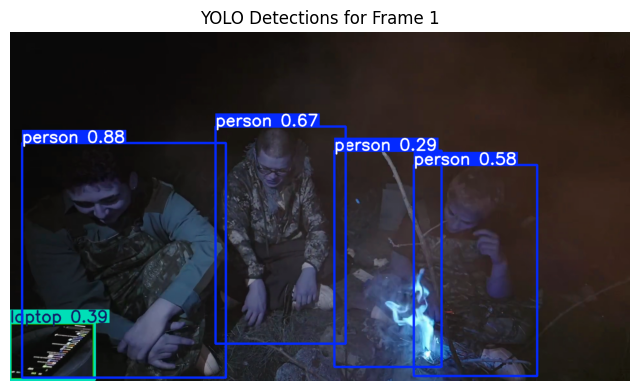

Processing frame 2/20: frame_pbm_0001.png

0: 384x640 2 persons, 1 laptop, 25.8ms
Speed: 1.0ms preprocess, 25.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 2 (frame_pbm_0001.png):
  Detection 1: Bounding box = [650, 292, 1033, 875]
  Detection 2: Bounding box = [52, 396, 680, 1068]

0: 384x640 2 persons, 1 laptop, 22.1ms
Speed: 1.2ms preprocess, 22.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


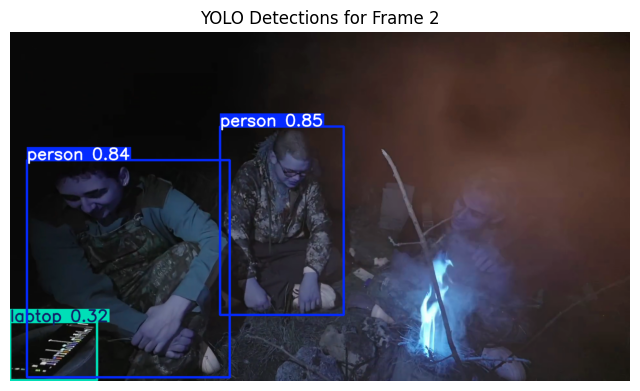

Processing frame 3/20: frame_pbm_0002.png

0: 384x640 3 persons, 22.0ms
Speed: 1.0ms preprocess, 22.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 3 (frame_pbm_0002.png):
  Detection 1: Bounding box = [692, 298, 1045, 892]
  Detection 2: Bounding box = [157, 364, 700, 1065]

0: 384x640 3 persons, 19.4ms
Speed: 1.0ms preprocess, 19.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


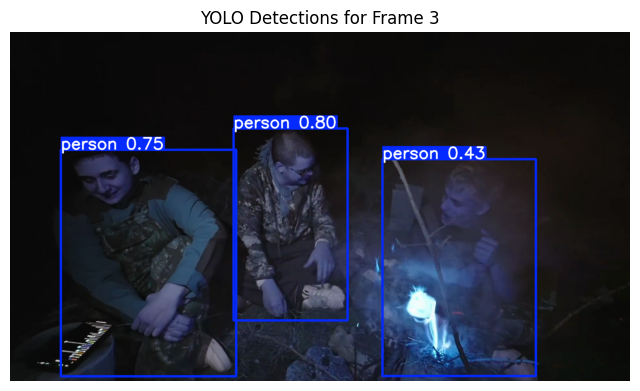

Processing frame 4/20: frame_pbm_0003.png

0: 384x640 4 persons, 24.2ms
Speed: 0.8ms preprocess, 24.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 4 (frame_pbm_0003.png):
  Detection 1: Bounding box = [673, 300, 1105, 889]
  Detection 2: Bounding box = [143, 375, 687, 1068]
  Detection 3: Bounding box = [1204, 427, 1568, 868]

0: 384x640 4 persons, 21.8ms
Speed: 0.9ms preprocess, 21.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


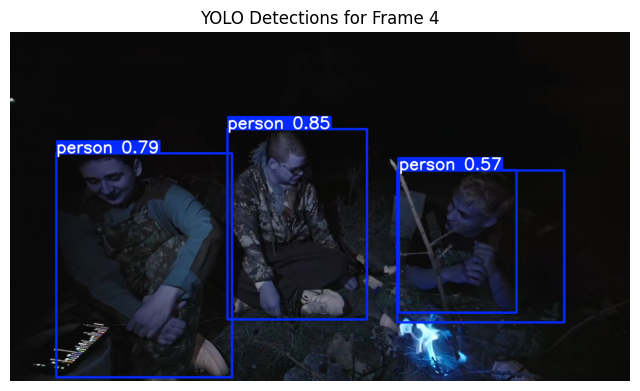

Processing frame 5/20: frame_pbm_0004.png

0: 384x640 3 persons, 20.2ms
Speed: 1.0ms preprocess, 20.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 5 (frame_pbm_0004.png):
  Detection 1: Bounding box = [223, 461, 658, 1068]
  Detection 2: Bounding box = [718, 362, 1124, 917]
  Detection 3: Bounding box = [1211, 455, 1598, 937]

0: 384x640 3 persons, 26.7ms
Speed: 1.0ms preprocess, 26.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


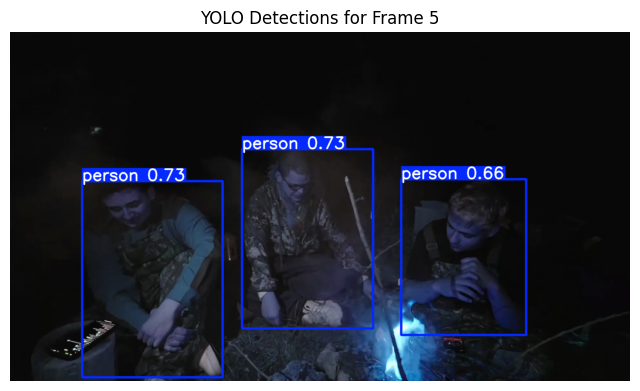

Processing frame 6/20: frame_pbm_0005.png

0: 384x640 5 persons, 21.7ms
Speed: 1.0ms preprocess, 21.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 6 (frame_pbm_0005.png):
  Detection 1: Bounding box = [218, 433, 598, 1067]
  Detection 2: Bounding box = [1126, 487, 1833, 1065]

0: 384x640 5 persons, 21.0ms
Speed: 1.0ms preprocess, 21.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


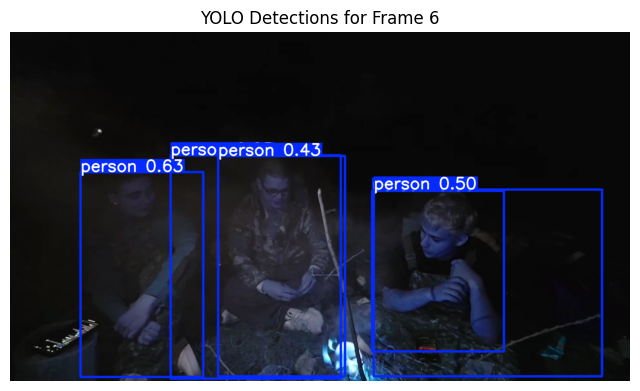

Processing frame 7/20: frame_pbm_0006.png

0: 384x640 3 persons, 44.6ms
Speed: 0.9ms preprocess, 44.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 7 (frame_pbm_0006.png):
  Detection 1: Bounding box = [1162, 500, 1747, 1046]

0: 384x640 3 persons, 23.5ms
Speed: 2.6ms preprocess, 23.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


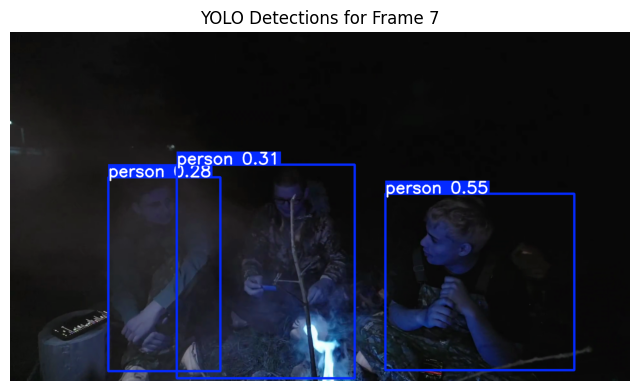

Processing frame 8/20: frame_pbm_0007.png

0: 384x640 4 persons, 46.4ms
Speed: 1.7ms preprocess, 46.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 8 (frame_pbm_0007.png):
  Detection 1: Bounding box = [311, 479, 672, 1068]
  Detection 2: Bounding box = [736, 406, 1098, 964]
  Detection 3: Bounding box = [1208, 513, 1901, 1074]

0: 384x640 4 persons, 33.4ms
Speed: 1.3ms preprocess, 33.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


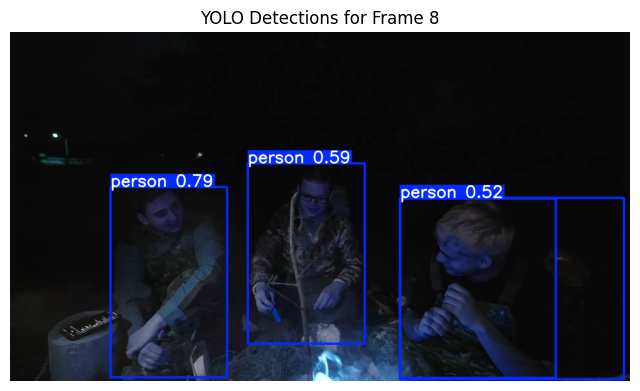

Processing frame 9/20: frame_pbm_0008.png

0: 384x640 3 persons, 24.7ms
Speed: 1.0ms preprocess, 24.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 9 (frame_pbm_0008.png):
  Detection 1: Bounding box = [1144, 573, 1774, 1071]
  Detection 2: Bounding box = [414, 474, 738, 1064]
  Detection 3: Bounding box = [851, 440, 1277, 1069]

0: 384x640 3 persons, 27.7ms
Speed: 0.9ms preprocess, 27.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


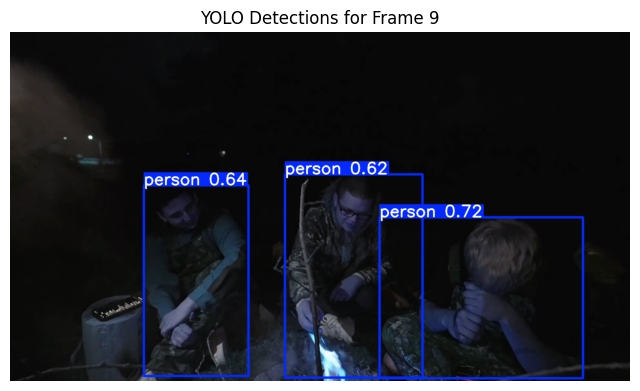

Processing frame 10/20: frame_pbm_0009.png

0: 384x640 3 persons, 31.4ms
Speed: 1.0ms preprocess, 31.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 10 (frame_pbm_0009.png):
  Detection 1: Bounding box = [762, 377, 1094, 1049]
  Detection 2: Bounding box = [358, 435, 693, 1031]

0: 384x640 3 persons, 30.4ms
Speed: 0.9ms preprocess, 30.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


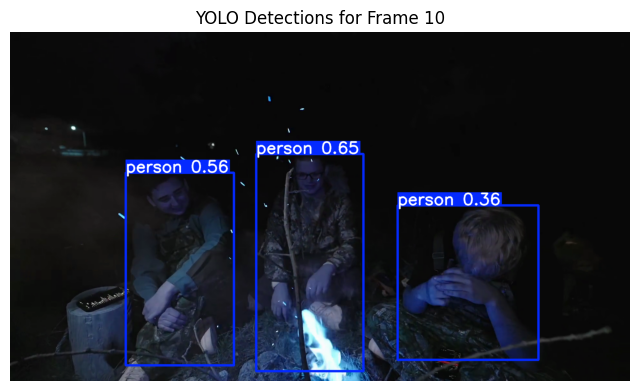

Processing frame 11/20: frame_pbm_0010.png

0: 384x640 3 persons, 21.8ms
Speed: 1.0ms preprocess, 21.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 11 (frame_pbm_0010.png):
  Detection 1: Bounding box = [344, 340, 682, 958]
  Detection 2: Bounding box = [760, 295, 1057, 880]

0: 384x640 3 persons, 28.1ms
Speed: 0.9ms preprocess, 28.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


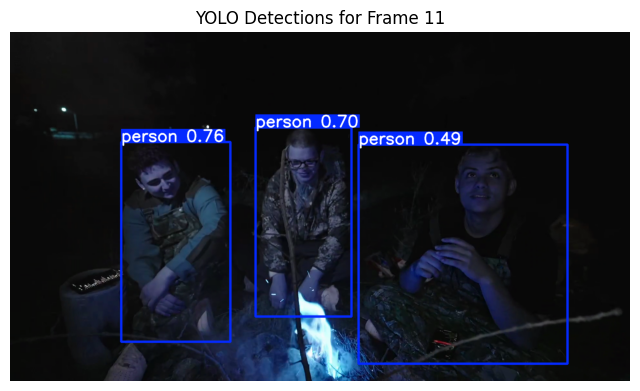

Processing frame 12/20: frame_pbm_0011.png

0: 384x640 3 persons, 38.6ms
Speed: 1.3ms preprocess, 38.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 12 (frame_pbm_0011.png):
  Detection 1: Bounding box = [357, 349, 684, 1039]
  Detection 2: Bounding box = [775, 314, 1080, 1059]

0: 384x640 3 persons, 32.1ms
Speed: 1.4ms preprocess, 32.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


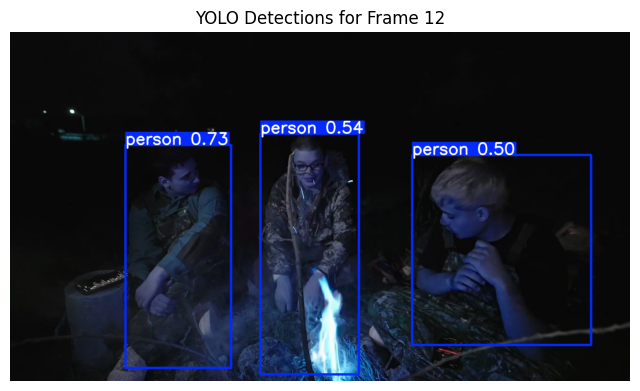

Processing frame 13/20: frame_pbm_0012.png

0: 384x640 3 persons, 24.3ms
Speed: 1.1ms preprocess, 24.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 13 (frame_pbm_0012.png):
  Detection 1: Bounding box = [363, 334, 728, 1006]
  Detection 2: Bounding box = [1302, 382, 1753, 956]
  Detection 3: Bounding box = [787, 320, 1091, 1019]

0: 384x640 3 persons, 27.3ms
Speed: 1.4ms preprocess, 27.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


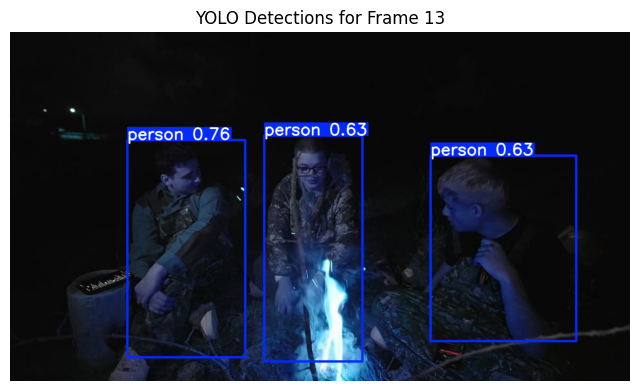

Processing frame 14/20: frame_pbm_0013.png

0: 384x640 4 persons, 1 tie, 20.8ms
Speed: 0.9ms preprocess, 20.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 14 (frame_pbm_0013.png):
  Detection 1: Bounding box = [342, 339, 713, 1056]
  Detection 2: Bounding box = [774, 318, 1067, 886]

0: 384x640 4 persons, 1 tie, 21.4ms
Speed: 0.9ms preprocess, 21.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)


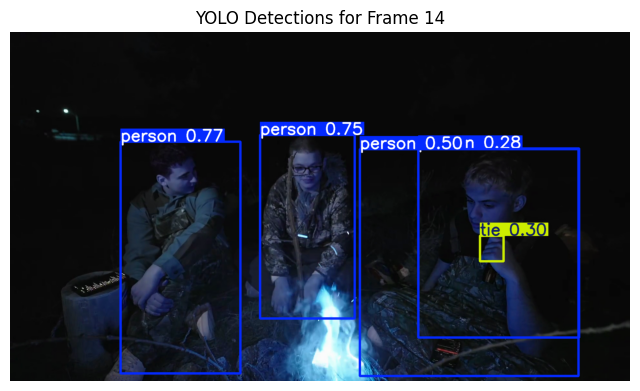

Processing frame 15/20: frame_pbm_0014.png

0: 384x640 4 persons, 1 cup, 23.0ms
Speed: 0.9ms preprocess, 23.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 15 (frame_pbm_0014.png):
  Detection 1: Bounding box = [785, 321, 1086, 905]
  Detection 2: Bounding box = [365, 337, 707, 1006]

0: 384x640 4 persons, 1 cup, 21.3ms
Speed: 1.0ms preprocess, 21.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


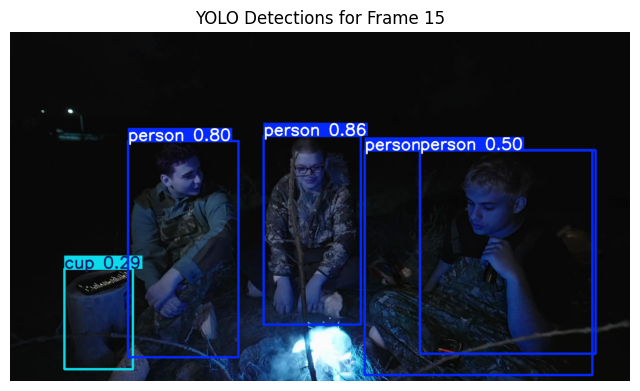

Processing frame 16/20: frame_pbm_0015.png

0: 384x640 4 persons, 23.7ms
Speed: 1.0ms preprocess, 23.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 16 (frame_pbm_0015.png):
  Detection 1: Bounding box = [784, 333, 1090, 887]
  Detection 2: Bounding box = [376, 371, 702, 950]

0: 384x640 4 persons, 21.0ms
Speed: 1.0ms preprocess, 21.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


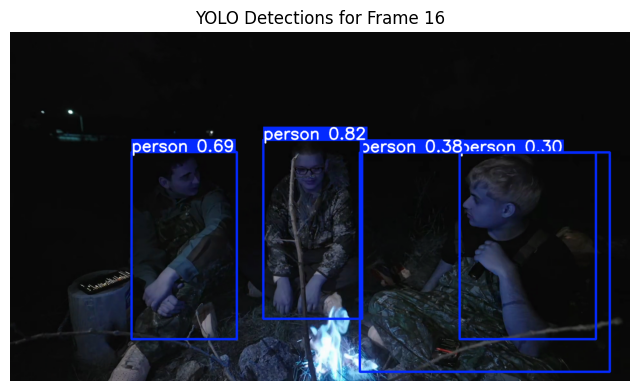

Processing frame 17/20: frame_pbm_0016.png

0: 384x640 3 persons, 72.6ms
Speed: 1.1ms preprocess, 72.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 17 (frame_pbm_0016.png):
  Detection 1: Bounding box = [784, 331, 1090, 877]
  Detection 2: Bounding box = [376, 377, 698, 930]
  Detection 3: Bounding box = [1102, 370, 1858, 1051]

0: 384x640 3 persons, 30.9ms
Speed: 1.2ms preprocess, 30.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


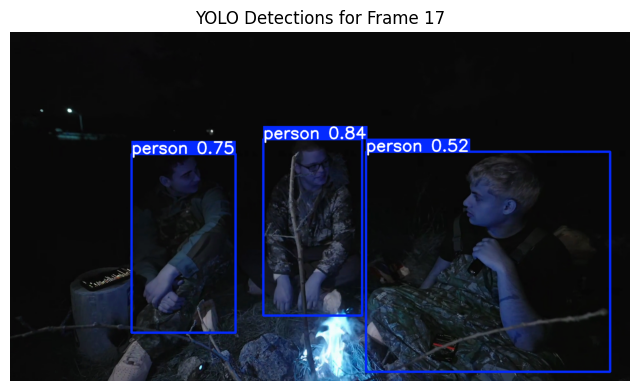

Processing frame 18/20: frame_pbm_0017.png

0: 384x640 3 persons, 1 cup, 26.0ms
Speed: 1.1ms preprocess, 26.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 18 (frame_pbm_0017.png):
  Detection 1: Bounding box = [813, 289, 1098, 826]
  Detection 2: Bounding box = [1120, 316, 1840, 1040]
  Detection 3: Bounding box = [410, 323, 719, 928]

0: 384x640 3 persons, 1 cup, 21.3ms
Speed: 0.9ms preprocess, 21.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


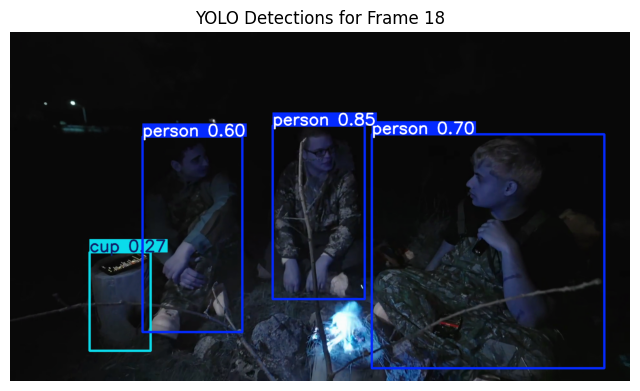

Processing frame 19/20: frame_pbm_0018.png

0: 384x640 3 persons, 34.7ms
Speed: 1.0ms preprocess, 34.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 19 (frame_pbm_0018.png):
  Detection 1: Bounding box = [737, 322, 1021, 855]
  Detection 2: Bounding box = [326, 338, 648, 900]

0: 384x640 3 persons, 29.0ms
Speed: 1.3ms preprocess, 29.0ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


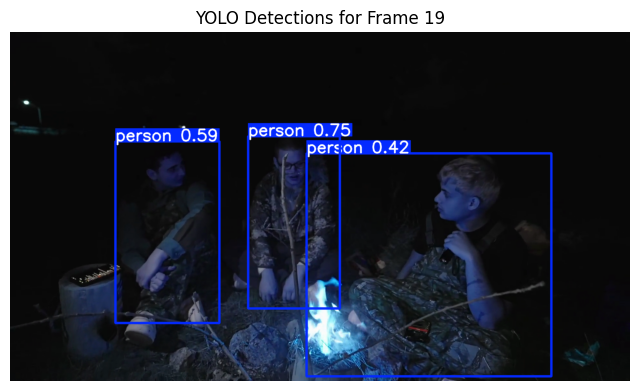

Processing frame 20/20: frame_pbm_0019.png

0: 384x640 3 persons, 45.2ms
Speed: 1.0ms preprocess, 45.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
YOLO detections for frame 20 (frame_pbm_0019.png):
  Detection 1: Bounding box = [751, 309, 1028, 826]
  Detection 2: Bounding box = [350, 328, 702, 879]

0: 384x640 3 persons, 25.8ms
Speed: 1.2ms preprocess, 25.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)


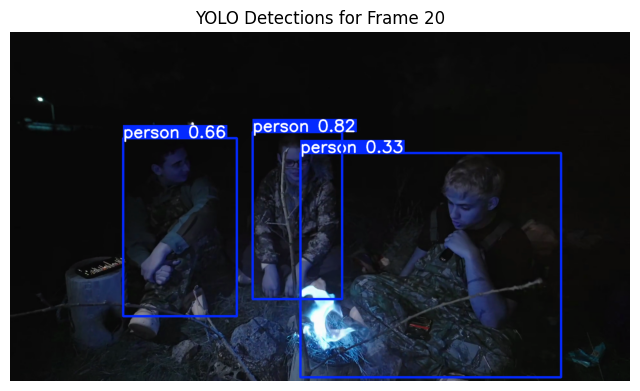

Running gaze detection model...
Saved visualization for frame_pbm_0000.png to output/viz_frame_pbm_0000.png
Saved visualization for frame_pbm_0001.png to output/viz_frame_pbm_0001.png
Saved visualization for frame_pbm_0002.png to output/viz_frame_pbm_0002.png
Saved visualization for frame_pbm_0003.png to output/viz_frame_pbm_0003.png
Saved visualization for frame_pbm_0004.png to output/viz_frame_pbm_0004.png
Saved visualization for frame_pbm_0005.png to output/viz_frame_pbm_0005.png
Saved visualization for frame_pbm_0006.png to output/viz_frame_pbm_0006.png
Saved visualization for frame_pbm_0007.png to output/viz_frame_pbm_0007.png
Saved visualization for frame_pbm_0008.png to output/viz_frame_pbm_0008.png
Saved visualization for frame_pbm_0009.png to output/viz_frame_pbm_0009.png
Saved visualization for frame_pbm_0010.png to output/viz_frame_pbm_0010.png
Saved visualization for frame_pbm_0011.png to output/viz_frame_pbm_0011.png
Saved visualization for frame_pbm_0012.png to output/viz

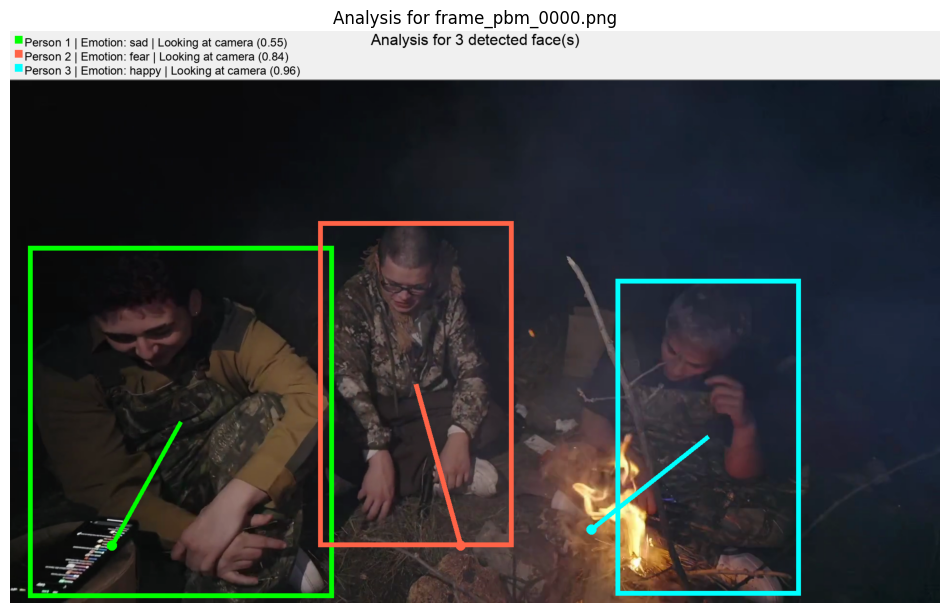

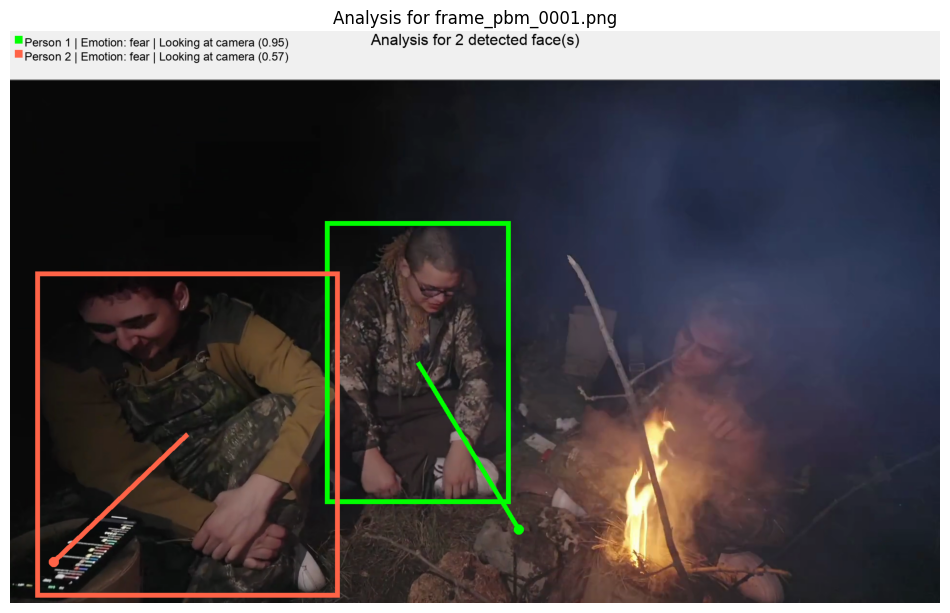

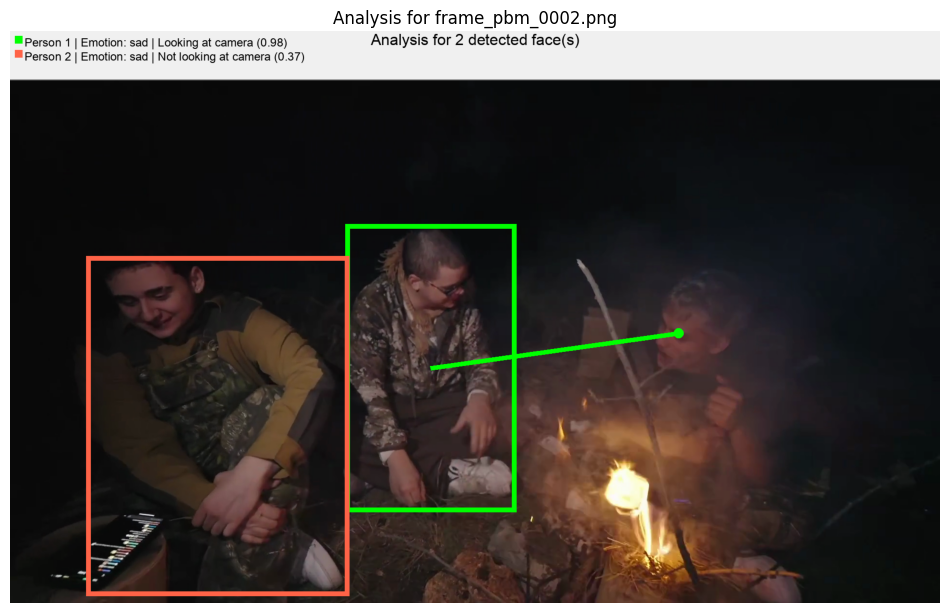

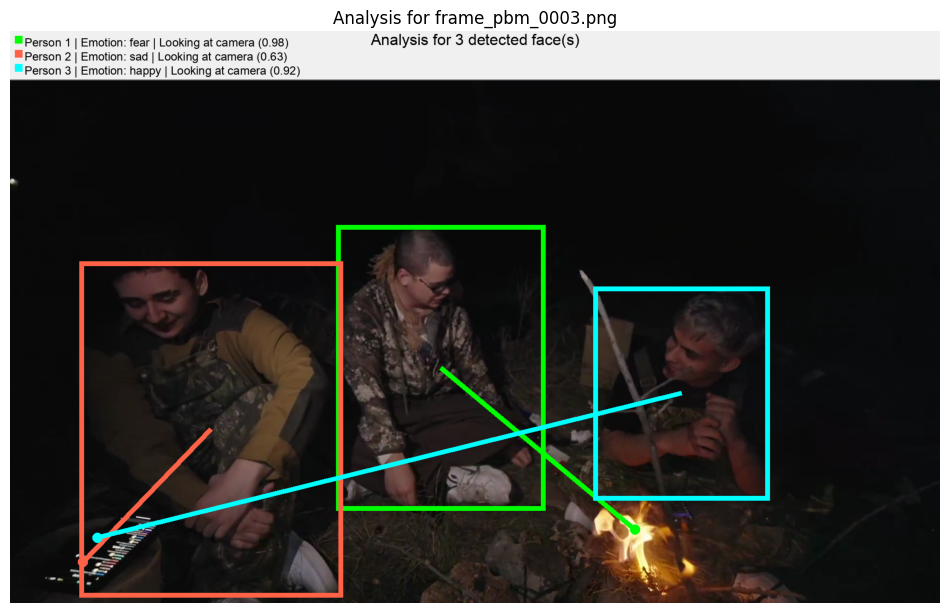

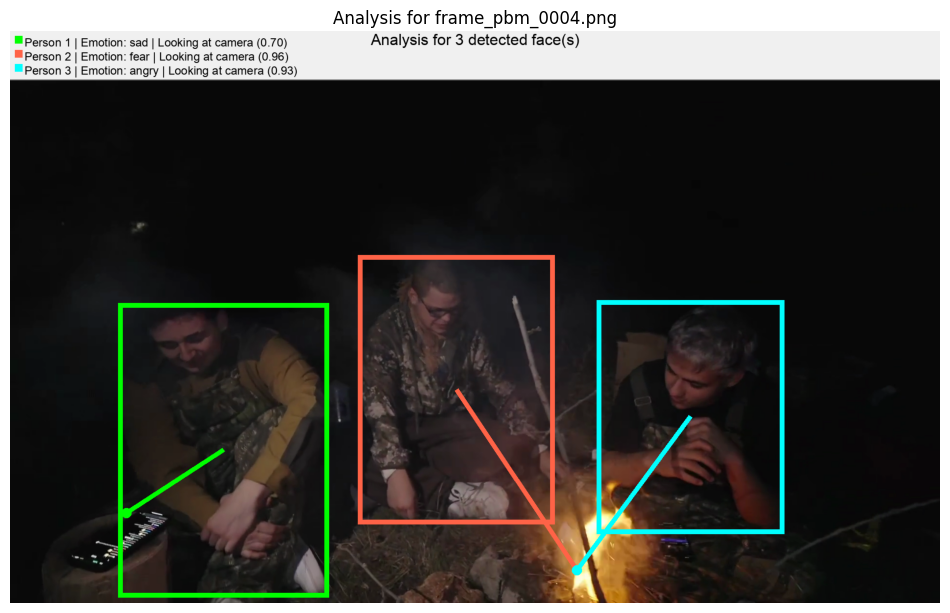

...

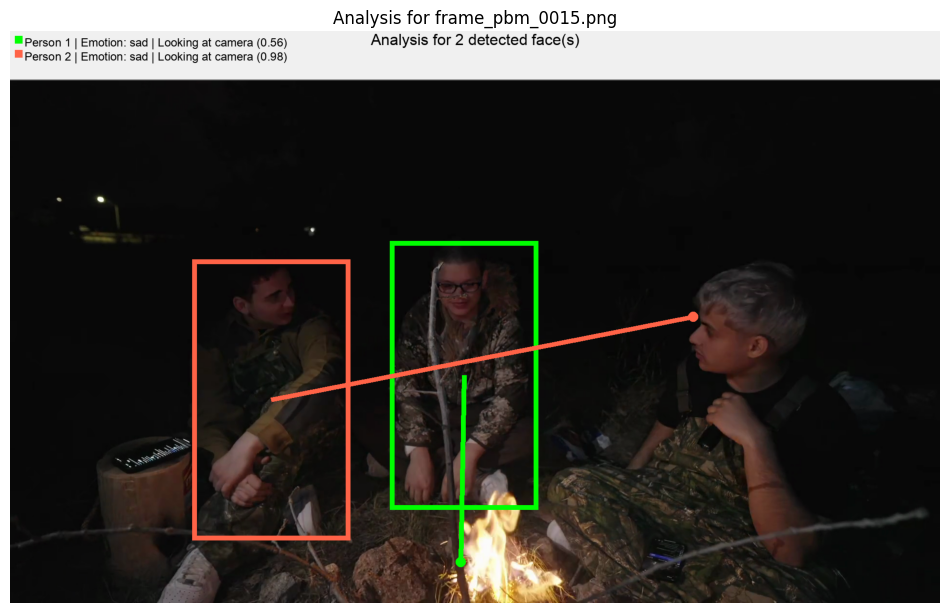

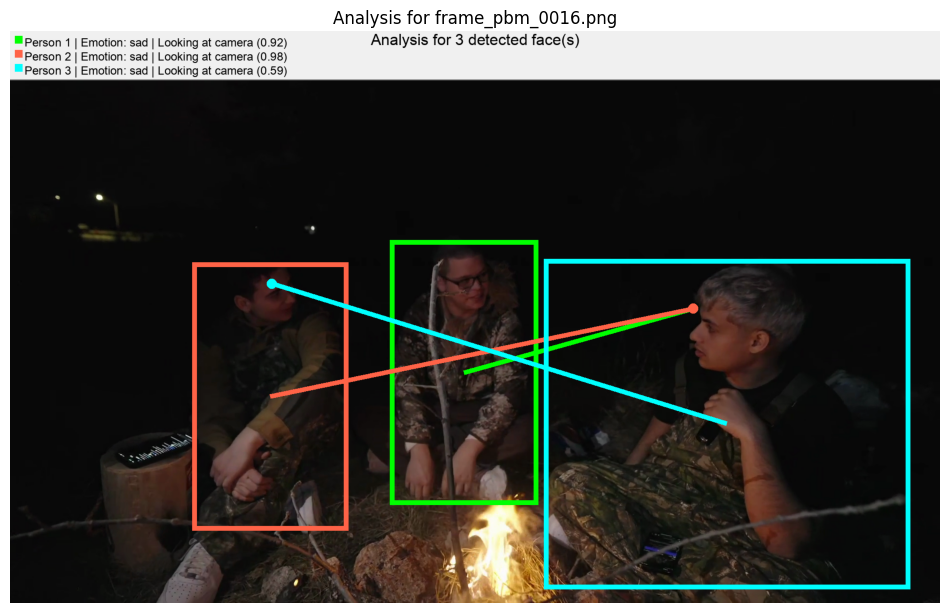

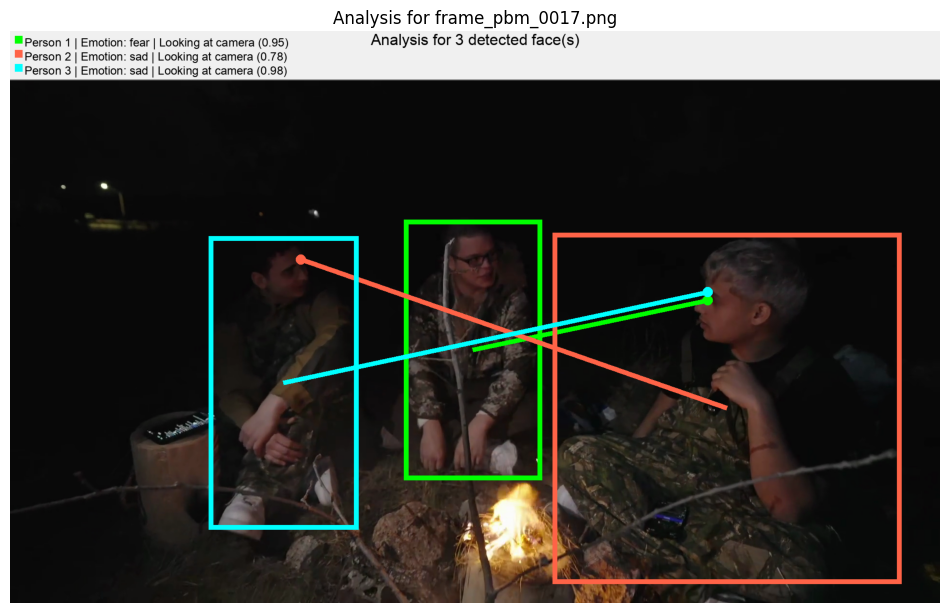

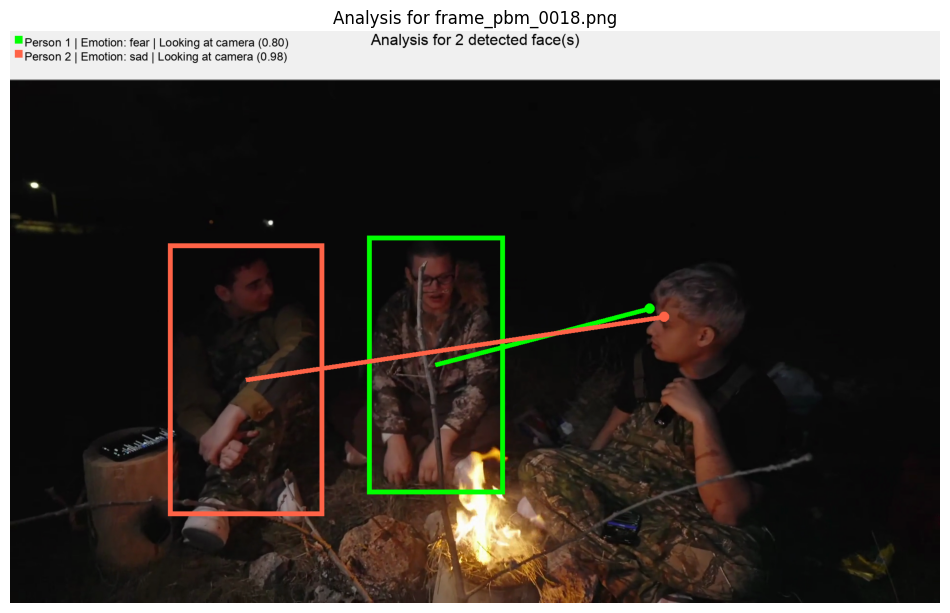

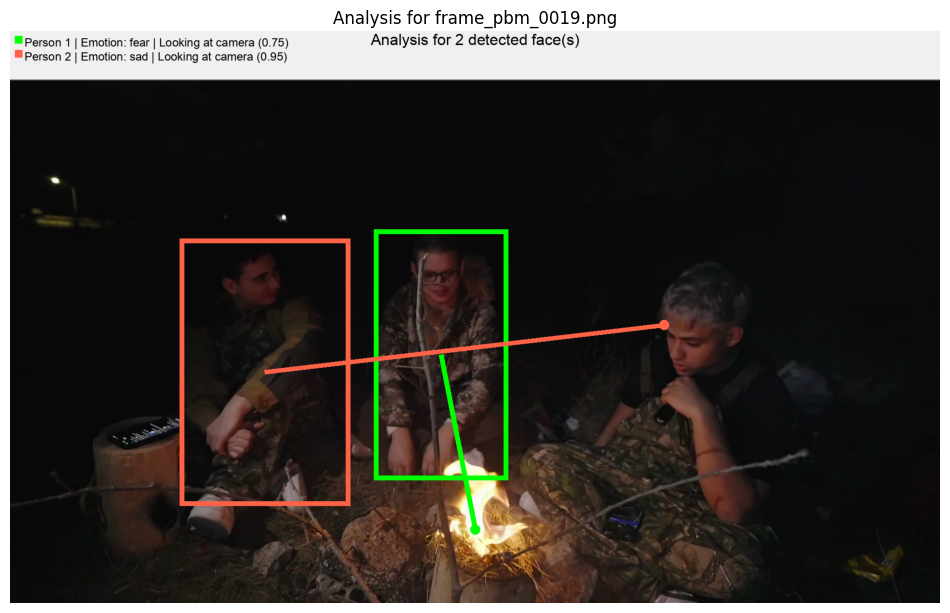


Profile Summary:
Profile 1 (Person 1): Appeared in 20 frames

LLM data has been created and saved to llm_analysis_input.json
This data can now be sent to an LLM for analysis.


In [53]:
import torch
import cv2
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from torchvision import transforms
import matplotlib.pyplot as plt
import os
import json
from deepface import DeepFace
from scipy.spatial.distance import cosine
from ultralytics import YOLO
from sklearn.cluster import DBSCAN  # new import for clustering

# -----------------------------
# Configuration and Constants
# -----------------------------
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Transform for gaze detection model
gaze_transform = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
])

# Threshold for matching face embeddings across frames (used initially)
EMBEDDING_THRESHOLD = 0.6
# Confidence threshold for YOLO face detection
YOLO_CONF_THRESHOLD = 0.5

# Flag to show YOLO detections per frame visually
SHOW_YOLO_DETECTIONS = True

# -----------------------------
# Custom JSON Encoder
# -----------------------------
class NumpyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, (np.integer)):
            return int(obj)
        elif isinstance(obj, (np.floating)):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NumpyEncoder, self).default(obj)

# -----------------------------
# YOLO Face Detection Function
# -----------------------------
def detect_faces_yolo(img_array, yolo_face_model, conf_threshold=YOLO_CONF_THRESHOLD):
    """
    Detect faces in an image using YOLO.
    
    Args:
        img_array: Input image as a NumPy array.
        yolo_face_model: Loaded YOLO model.
        conf_threshold: Confidence threshold.
    
    Returns:
        List of bounding boxes [x1, y1, x2, y2] in pixel coordinates.
    """
    results = yolo_face_model(img_array)
    face_boxes = []
    if results and results[0].boxes is not None:
        boxes = results[0].boxes.xyxy.cpu().numpy()  # [N,4]
        confs = results[0].boxes.conf.cpu().numpy()    # [N]
        for box, conf in zip(boxes, confs):
            if conf >= conf_threshold:
                face_boxes.append([int(x) for x in box])
    return face_boxes

# -----------------------------
# (Optional) Known Faces Loading (Profiles)
# -----------------------------
def load_known_faces(image_paths, yolo_face_model):
    """
    Load known faces (profiles) using YOLO for detection and DeepFace for embeddings.
    
    Args:
        image_paths: Dictionary {name: image_path}
        yolo_face_model: Loaded YOLO model.
    
    Returns:
        Dictionary {name: embedding} for known people.
    """
    known_faces = {}
    for name, path in image_paths.items():
        try:
            img = cv2.imread(path)
            if img is None:
                print(f"Could not load image for {name} at {path}")
                continue
            detected = detect_faces_yolo(img, yolo_face_model)
            if detected:
                x1, y1, x2, y2 = detected[0]
                face_roi = img[y1:y2, x1:x2]
                rep = DeepFace.represent(face_roi, model_name='Facenet512',
                                         detector_backend='skip', enforce_detection=False)
                embedding = np.array(rep[0]['embedding'])
                known_faces[name] = embedding
                print(f"Successfully loaded face for {name}")
            else:
                print(f"No face detected for {name} in {path}")
        except Exception as e:
            print(f"Error loading face for {name}: {e}")
    return known_faces

# -----------------------------
# Face Embedding and Matching
# -----------------------------
def get_face_embedding(face_roi):
    """Extract face embedding using DeepFace (detection skipped)."""
    try:
        rep = DeepFace.represent(face_roi, model_name='Facenet512',
                                 detector_backend='skip', enforce_detection=False)
        return np.array(rep[0]['embedding'])
    except Exception as e:
        print(f"Embedding error: {e}")
        return None

def match_known_face(face_emb, known_faces):
    """
    Match a face embedding to the most similar known face.
    
    Args:
        face_emb: Detected face embedding.
        known_faces: Dictionary {name: embedding}.
    
    Returns:
        Tuple (name, similarity_score)
    """
    best_match = None
    best_score = float('inf')
    for kname, known_emb in known_faces.items():
        dist = cosine(known_emb, face_emb)
        if dist < best_score:
            best_score = dist
            best_match = kname
    return best_match, best_score

def analyze_emotions(face_roi):
    """
    Analyze emotions for the given face ROI using DeepFace.
    """
    try:
        analysis = DeepFace.analyze(face_roi, actions=['emotion'],
                                    detector_backend='skip', enforce_detection=False)
        return analysis[0]['dominant_emotion']
    except Exception as e:
        print(f"Emotion analysis error: {e}")
        return "Unknown"

# -----------------------------
# Visualization Function
# -----------------------------
def visualize_all(pil_image, heatmaps, bboxes, inout_scores=None, emotions=None, names=None, inout_thresh=0.5):
    """
    Create a visualization image with bounding boxes, gaze points, and header text.
    
    Args:
        pil_image: PIL Image.
        heatmaps: Heatmaps for each face.
        bboxes: Normalized bounding boxes (values in [0, 1]).
        inout_scores: In-out scores for gaze (optional).
        emotions: Emotion strings (optional).
        names: Face names (optional).
        inout_thresh: Threshold for considering gaze as "looking at camera".
    
    Returns:
        An annotated PIL Image.
    """
    colors = ['lime', 'tomato', 'cyan', 'fuchsia', 'yellow']
    width, height = pil_image.size
    header_height = 100
    output_img = Image.new("RGBA", (width, height + header_height), (255,255,255,255))
    output_img.paste(pil_image, (0, header_height))
    draw = ImageDraw.Draw(output_img)
    draw.rectangle([0, 0, width, header_height], fill=(240,240,240,255))
    draw.line([(0, header_height), (width, header_height)], fill=(100,100,100,255), width=2)
    header_text = []
    for i, norm_box in enumerate(bboxes):
        xmin, ymin, xmax, ymax = norm_box
        xmin_px = xmin * width
        ymin_px = ymin * height + header_height
        xmax_px = xmax * width
        ymax_px = ymax * height + header_height
        color = colors[i % len(colors)]
        line_width = max(1, int(min(width, height) * 0.01))
        draw.rectangle([xmin_px, ymin_px, xmax_px, ymax_px], outline=color, width=line_width)
        info_list = []
        if names is not None and i < len(names):
            info_list.append(f"{names[i]}")
        else:
            info_list.append(f"Person {i+1}")
        if emotions is not None and i < len(emotions):
            info_list.append(f"Emotion: {emotions[i]}")
        if inout_scores is not None and i < len(inout_scores):
            score_val = float(inout_scores[i].item() if torch.is_tensor(inout_scores[i]) else inout_scores[i])
            look_str = "Looking at camera" if score_val > inout_thresh else "Not looking at camera"
            info_list.append(f"{look_str} ({score_val:.2f})")
        header_text.append((info_list, color))
        if heatmaps is not None and i < len(heatmaps):
            do_draw = True
            if inout_scores is not None and i < len(inout_scores):
                score_val = float(inout_scores[i].item() if torch.is_tensor(inout_scores[i]) else inout_scores[i])
                do_draw = score_val > inout_thresh
            if do_draw:
                heat_np = heatmaps[i].detach().cpu().numpy() if torch.is_tensor(heatmaps[i]) else heatmaps[i]
                max_idx = np.unravel_index(np.argmax(heat_np), heat_np.shape)
                gaze_y, gaze_x = max_idx
                gaze_x = gaze_x / heat_np.shape[1] * width
                gaze_y = gaze_y / heat_np.shape[0] * height + header_height
                center_x = ((xmin + xmax) / 2) * width
                center_y = ((ymin + ymax) / 2) * height + header_height
                radius = max(1, int(min(width, height) * 0.01))
                draw.ellipse([(gaze_x - radius, gaze_y - radius), (gaze_x + radius, gaze_y + radius)], fill=color)
                draw.line([(center_x, center_y), (gaze_x, gaze_y)], fill=color, width=line_width)
    font_size = 24
    try:
        font = ImageFont.truetype("Arial", font_size)
    except:
        font = ImageFont.load_default()
    y_offset = 10
    for info, col in header_text:
        box_size = 15
        draw.rectangle([10, y_offset, 10 + box_size, y_offset + box_size], fill=col)
        draw.text((10 + box_size + 5, y_offset), " | ".join(info), fill="black", font=font)
        y_offset += font_size + 5
    title = f"Analysis for {len(bboxes)} detected face(s)"
    title_font_size = 32
    try:
        title_font = ImageFont.truetype("Arial", title_font_size)
    except:
        title_font = font
    title_width = title_font.getlength(title) if title_font else len(title) * title_font_size * 0.6
    title_x = (width - title_width) / 2
    draw.text((title_x, 0), title, fill="black", font=title_font)
    return output_img

# -----------------------------
# Visualize YOLO Detections Function
# -----------------------------
def visualize_yolo_detections(img_array, yolo_face_model, save_path=None):
    """
    Use the YOLO model's built-in plotting method to create an annotated image.
    
    Args:
        img_array: Input image as a NumPy array.
        yolo_face_model: Loaded YOLO model.
        save_path: Optional path to save the annotated image.
    
    Returns:
        Annotated image as a NumPy array.
    """
    results = yolo_face_model(img_array)
    annotated_img = results[0].plot()  # Get annotated image from the first result
    if save_path:
        cv2.imwrite(save_path, annotated_img)
    return annotated_img

# -----------------------------
# Function to Reclustering Profiles Using DBSCAN
# -----------------------------
def recluster_profiles(profiles, eps=0.2):
    """
    Recluster the collected profile embeddings using DBSCAN to separate distinct individuals.
    
    Args:
        profiles: Dictionary mapping profile IDs to dicts that contain at least an "embedding" and "frames_seen".
        eps: The epsilon parameter for DBSCAN (in cosine distance).
    
    Returns:
        new_profiles: Dictionary with new profile IDs and aggregated frame appearances.
        cluster_map: Dictionary mapping old profile IDs to new cluster labels.
    """
    old_ids = []
    embeddings = []
    for pid, prof in profiles.items():
        old_ids.append(pid)
        embeddings.append(prof["embedding"])
    embeddings = np.array(embeddings)
    db = DBSCAN(eps=eps, min_samples=1, metric='cosine').fit(embeddings)
    labels = db.labels_
    cluster_map = {old: label for old, label in zip(old_ids, labels)}
    new_profiles = {}
    for old_pid, label in cluster_map.items():
        if label in new_profiles:
            new_profiles[label]["frames_seen"].extend(profiles[old_pid]["frames_seen"])
        else:
            new_profiles[label] = {
                "embedding": profiles[old_pid]["embedding"],
                "name": f"Person {label + 1}",
                "frames_seen": profiles[old_pid]["frames_seen"].copy()
            }
    return new_profiles, cluster_map

# -----------------------------
# Create JSON for LLM Analysis (without id field)
# -----------------------------
def create_llm_input(results, output_path="llm_analysis_input.json"):
    """
    Convert analysis results to a structured JSON file without including an 'id' field for persons.
    
    Args:
        results: Analysis result dictionary.
        output_path: Path to save the JSON file.
        
    Returns:
        The structured data dictionary.
    """
    llm_data = {
        "session_summary": {
            "total_frames": len([k for k in results.keys() if k not in ['profiles', 'visualizations']]),
            "people_detected": {}
        },
        "frames": []
    }
    profiles = results.get('profiles', {})
    for pid, prof in profiles.items():
        # In session summary, we keep only the person name and frames_seen.
        llm_data["session_summary"]["people_detected"][str(pid)] = {
            "name": prof['name'],
            "frame_appearances": prof['frames_seen']
        }
    for frame_path, frame_data in results.items():
        if frame_path in ['profiles', 'visualizations']:
            continue
        entry = {"frame_path": frame_path, "people": []}
        for face in frame_data.get('faces', []):
            # Note: Remove the "id" field from each person.
            person = {
                "name": face.get('name', "Unknown"),
                "emotion": face.get('emotion', "Unknown"),
                "position": {
                    "x1": int(face['bbox'][0]),
                    "y1": int(face['bbox'][1]),
                    "x2": int(face['bbox'][2]),
                    "y2": int(face['bbox'][3])
                }
            }
            gaze_info = face.get('gaze', {})
            if gaze_info:
                person["gaze"] = {
                    "looking_at_camera": gaze_info.get("looking_at_camera", False),
                    "confidence": float(gaze_info.get("inout_score", 0))
                }
                heat = gaze_info.get("heatmap")
                if heat:
                    heat_np = np.array(heat)
                    max_idx = np.unravel_index(np.argmax(heat_np), heat_np.shape)
                    norm_x = float(max_idx[1]) / heat_np.shape[1]
                    norm_y = float(max_idx[0]) / heat_np.shape[0]
                    person["gaze"]["target"] = {"x": norm_x, "y": norm_y}
            entry["people"].append(person)
        if entry["people"]:
            summaries = []
            for person in entry["people"]:
                summ = f"{person['name']} shows {person['emotion']} emotion"
                if "gaze" in person:
                    if person["gaze"].get("looking_at_camera", False):
                        summ += " and is looking at the camera"
                    else:
                        summ += " and is not looking at the camera"
                summaries.append(summ)
            entry["natural_language_summary"] = ". ".join(summaries) + "."
        else:
            entry["natural_language_summary"] = "No people detected in this frame."
        llm_data["frames"].append(entry)
    with open(output_path, 'w') as f:
        json.dump(llm_data, f, indent=2, cls=NumpyEncoder)
    print(f"LLM analysis input saved to {output_path}")
    preview = json.dumps(llm_data, indent=2, cls=NumpyEncoder)
    print(preview[:1000] + "...\n" if len(preview) > 1000 else preview)
    return llm_data

# -----------------------------
# Main Analysis Function (per frame)
# -----------------------------
def analyze_frames(image_paths, gaze_model, yolo_face_model, known_faces=None, output_dir=None, llm_output_path="llm_analysis_input.json"):
    profiles = {}
    results = {}
    img_tensors = []
    norm_boxes_all = []
    frame_faces_all = []
    print(f"Processing {len(image_paths)} frames...")
    for idx, path in enumerate(image_paths):
        print(f"Processing frame {idx+1}/{len(image_paths)}: {path}")
        try:
            pil_image = Image.open(path).convert("RGB")
        except Exception as e:
            print(f"Error opening {path}: {e}")
            continue
        width, height = pil_image.size
        np_img = np.array(pil_image)
        cv_img = cv2.cvtColor(np_img, cv2.COLOR_RGB2BGR)
        
        # --- YOLO Detection Step ---
        detected = detect_faces_yolo(np_img, yolo_face_model)
        print(f"YOLO detections for frame {idx+1} ({path}):")
        if detected:
            for j, bbox in enumerate(detected):
                print(f"  Detection {j+1}: Bounding box = {bbox}")
        else:
            print("  No faces detected by YOLO.")
        
        if SHOW_YOLO_DETECTIONS:
            annotated_img = visualize_yolo_detections(np_img, yolo_face_model)
            plt.figure(figsize=(8, 6))
            plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
            plt.title(f"YOLO Detections for Frame {idx+1}")
            plt.axis("off")
            plt.show()
        
        results[path] = {"faces": []}
        face_list = []
        norm_list = []
        used_pids = set()
        if detected:
            for det in detected:
                x1, y1, x2, y2 = det
                face_roi = cv_img[y1:y2, x1:x2]
                if face_roi.size == 0:
                    continue
                emb = get_face_embedding(face_roi)
                if emb is None:
                    continue
                emotion = analyze_emotions(face_roi)
                ident = None
                sim_score = None
                if known_faces:
                    ident, sim_score = match_known_face(emb, known_faces)
                    print(f"Frame {idx}: Matched face with {ident} (score: {sim_score:.4f})")
                pid = None
                # Only match profiles not already used in this frame.
                for p, prof in profiles.items():
                    if p in used_pids:
                        continue
                    if cosine(prof['embedding'], emb) < EMBEDDING_THRESHOLD:
                        pid = p
                        break
                if pid is None:
                    pid = len(profiles) + 1
                    profiles[pid] = {"embedding": emb, "name": ident if ident else f"Person {pid}", "frames_seen": []}
                profiles[pid]["frames_seen"].append(idx)
                used_pids.add(pid)
                if ident and profiles[pid]["name"].startswith("Person "):
                    profiles[pid]["name"] = ident
                face_data = {
                    "bbox": (x1, y1, x2, y2),
                    "profile_id": pid,
                    "identity": ident,
                    "similarity_score": sim_score,
                    "emotion": emotion,
                    "name": profiles[pid]["name"]
                }
                face_list.append(face_data)
                norm_box = np.array([x1/width, y1/height, x2/width, y2/height])
                norm_list.append(norm_box)
        else:
            norm_list = []
        norm_boxes_all.append(norm_list)
        frame_faces_all.append(face_list)
        tensor_img = gaze_transform(pil_image).unsqueeze(0).to(device)
        img_tensors.append(tensor_img)
    
    gaze_out = None
    if img_tensors and any(len(b) > 0 for b in norm_boxes_all):
        img_batch = torch.cat(img_tensors, dim=0)
        inp = {"images": img_batch, "bboxes": norm_boxes_all}
        print("Running gaze detection model...")
        with torch.no_grad():
            gaze_out = gaze_model(inp)
    
    visuals = {}
    for f_idx, path in enumerate(image_paths):
        faces = frame_faces_all[f_idx]
        results[path]["faces"] = []
        if not faces:
            continue
        try:
            pil_image = Image.open(path).convert("RGB")
        except:
            continue
        frame_norm_boxes = []
        frame_names = []
        frame_emotions = []
        frame_inout = []
        for face in faces:
            x1, y1, x2, y2 = face["bbox"]
            frame_norm_box = (x1/width, y1/height, x2/width, y2/height)
            frame_norm_boxes.append(frame_norm_box)
            frame_names.append(face["name"])
            frame_emotions.append(face["emotion"])
            complete_face = {
                "bbox": face["bbox"],
                "profile_id": face["profile_id"],
                "name": face["name"],
                "similarity_score": face.get("similarity_score"),
                "emotion": face["emotion"],
                "gaze": {}
            }
            if gaze_out:
                face_idx = faces.index(face)
                if "inout" in gaze_out and f_idx < len(gaze_out["inout"]) and face_idx < len(gaze_out["inout"][f_idx]):
                    inout_score = gaze_out["inout"][f_idx][face_idx].item()
                    frame_inout.append(inout_score)
                    complete_face["gaze"]["inout_score"] = inout_score
                    complete_face["gaze"]["looking_at_camera"] = inout_score > 0.5
                else:
                    frame_inout.append(None)
                if "heatmap" in gaze_out and f_idx < len(gaze_out["heatmap"]) and face_idx < len(gaze_out["heatmap"][f_idx]):
                    hm = gaze_out["heatmap"][f_idx][face_idx].cpu().numpy()
                    complete_face["gaze"]["heatmap"] = hm.tolist()
            results[path]["faces"].append(complete_face)
        if gaze_out and "heatmap" in gaze_out and f_idx < len(gaze_out["heatmap"]):
            frame_hm = gaze_out["heatmap"][f_idx]
            vis_img = visualize_all(
                pil_image,
                frame_hm,
                frame_norm_boxes,
                frame_inout,
                frame_emotions,
                frame_names
            )
            visuals[path] = vis_img
            if output_dir:
                os.makedirs(output_dir, exist_ok=True)
                out_path = os.path.join(output_dir, f"viz_{os.path.basename(path)}")
                vis_img.save(out_path)
                print(f"Saved visualization for {path} to {out_path}")
    
    # --- Partition profiles into multi-frame and single-frame detections ---
    multi_profiles = {pid: prof for pid, prof in profiles.items() if len(set(prof["frames_seen"])) > 1}
    single_profiles = {pid: prof for pid, prof in profiles.items() if len(set(prof["frames_seen"])) == 1}
    
    # --- Recluster multi-frame profiles using DBSCAN ---
    if multi_profiles:
        new_multi_profiles, cluster_map_multi = recluster_profiles(multi_profiles, eps=0.2)
    else:
        new_multi_profiles, cluster_map_multi = {}, {}
    
    # For single-frame detections, assign new unique IDs starting after multi clusters.
    offset = len(new_multi_profiles)
    new_single_profiles = {}
    for i, (pid, prof) in enumerate(sorted(single_profiles.items())):
        new_id = offset + i + 1
        new_single_profiles[new_id] = {"name": prof["name"], "frames_seen": prof["frames_seen"]}
    
    # Build a unified mapping: for multi, map old pid -> new id, for single use sorted order.
    all_mapping = {}
    for old_pid in multi_profiles:
        all_mapping[old_pid] = cluster_map_multi[old_pid] + 1
    sorted_single = sorted(single_profiles.items(), key=lambda x: x[0])
    for i, (old_pid, prof) in enumerate(sorted_single):
        new_id = offset + i + 1
        all_mapping[old_pid] = new_id
    
    # Update each face in results with new profile id from all_mapping.
    for frame_path, data in results.items():
        if frame_path in ['profiles', 'visualizations']:
            continue
        for face in data.get("faces", []):
            old_pid = face["profile_id"]
            if old_pid in all_mapping:
                face["profile_id"] = all_mapping[old_pid]
    
    # Build the final profiles dictionary.
    combined_profiles = {}
    for label, p in new_multi_profiles.items():
        combined_profiles[label + 1] = {"name": p["name"], "frames_seen": sorted(list(set(p["frames_seen"])))}
    for new_id, p in new_single_profiles.items():
        combined_profiles[new_id] = {"name": p["name"], "frames_seen": sorted(list(set(p["frames_seen"])))}
    results["profiles"] = combined_profiles
    results["visualizations"] = visuals
    print("Analysis complete!")
    llm_data = create_llm_input(results, llm_output_path)
    return results, llm_data

# -----------------------------
# Display Analysis Results
# -----------------------------
def display_results(results):
    visual_out = results.get("visualizations", {})
    for path, vis_img in visual_out.items():
        plt.figure(figsize=(12, 8))
        plt.imshow(vis_img)
        plt.title(f"Analysis for {os.path.basename(path)}")
        plt.axis("off")
        plt.show()
    profs = results.get("profiles", {})
    if profs:
        print("\nProfile Summary:")
        for pid, prof in profs.items():
            print(f"Profile {pid} ({prof['name']}): Appeared in {len(prof['frames_seen'])} frames")

# -----------------------------
# Main Execution Block
# -----------------------------
if __name__ == "__main__":
    image_paths = [
        "frame_pbm_0000.png", "frame_pbm_0001.png", "frame_pbm_0002.png", "frame_pbm_0003.png", "frame_pbm_0004.png",
        "frame_pbm_0005.png", "frame_pbm_0006.png", "frame_pbm_0007.png", "frame_pbm_0008.png", "frame_pbm_0009.png",
        "frame_pbm_0010.png", "frame_pbm_0011.png", "frame_pbm_0012.png", "frame_pbm_0013.png", "frame_pbm_0014.png",
        "frame_pbm_0015.png", "frame_pbm_0016.png", "frame_pbm_0017.png", "frame_pbm_0018.png", "frame_pbm_0019.png",
    ]
    # Load gaze detection model
    gaze_model, _ = torch.hub.load('fkryan/gazelle', 'gazelle_dinov2_vitl14_inout')
    gaze_model.eval()
    gaze_model.to('cpu')
    # Load YOLO face detection model (replace with your YOLO–face model if available)
    yolo_model_path = "yolov8n.pt"
    print(f"Loading YOLO model from {yolo_model_path} on {device}...")
    try:
        yolo_face_model = YOLO(yolo_model_path)
        yolo_face_model.to(device)
    except Exception as e:
        print(f"Error loading YOLO model: {e}")
        exit(1)
    # For this run, we set known_faces to None (thus no known faces are used)
    known_faces = None
    # Analyze frames
    results, llm_data = analyze_frames(
        image_paths,
        gaze_model,
        yolo_face_model,
        known_faces,
        output_dir="output",
        llm_output_path="llm_analysis_input.json"
    )
    # Display visual results
    display_results(results)
    print("\nLLM data has been created and saved to llm_analysis_input.json")
    print("This data can now be sent to an LLM for analysis.")


In [7]:
%pip install openai

  Using cached distro-1.9.0-py3-none-any.whl.metadata (6.8 kB)
  Using cached pydantic-2.11.3-py3-none-any.whl.metadata (65 kB)
  Using cached annotated_types-0.7.0-py3-none-any.whl.metadata (15 kB)
  Using cached typing_inspection-0.4.0-py3-none-any.whl.metadata (2.6 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.4/644.4 kB 6.2 MB/s eta 0:00:00
Using cached distro-1.9.0-py3-none-any.whl (20 kB)
Using cached pydantic-2.11.3-py3-none-any.whl (443 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 14.8 MB/s eta 0:00:00
Using cached annotated_types-0.7.0-py3-none-any.whl (13 kB)
Using cached typing_inspection-0.4.0-py3-none-any.whl (14 kB)
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import cv2
import numpy as np
import os
import glob
import json
import sys
import subprocess
from typing import List, Tuple, Optional, Dict
from openai import OpenAI

def get_all_crops_from_openai(json_data: dict) -> Dict[int, Tuple[int, int, int, int]]:
    """
    Make a single call to OpenAI API to get crop suggestions for all frames.
    
    Args:
        json_data: Complete JSON data with all frames
        
    Returns:
        Dictionary mapping second indices to crop regions (x, y, width, height)
    """
    # Make sure API key is set
    api_key = ""
    if not api_key:
        raise ValueError("OpenAI API key is not set")
    
    # Initialize the OpenAI client
    client = OpenAI(api_key=api_key)
    
    # Prepare the prompt for OpenAI
    prompt = f"""
    Analyze this video frame data for all frames and suggest optimal crop rectangles for each SECOND of video.
    
    Complete frame data:
    {json.dumps(json_data, indent=2)}
    
    For each SECOND of video, based on the people's positions, emotions, and gaze directions, suggest a crop rectangle that:
    This means you should have 20 outputs, one for each second of the video. i am giving you 20 frames, each which is the first for that second
    thus, output 20 dictionary maps.
    1. Keeps all relevant people in the frame
    2. Focuses on the most interesting interactions. take into account whether the location of someones gaze in on another persons face.
    3. Gives appropriate space around the subjects. Remember to give appropriate space.
    4. Also remember these are going together like a video. Many sudden cuts can be hard to watch, so try to keep the frames smooth.
    5. However, if someone is strongly the main character, feel free to cut to them and make them the focus, just make sure it doesnt jump around too too much, but a little it ok.
    6. I want you to zoom in 1 person at least once.
    7. Remember that each person has a body. this is very important because we dont want to zoom in on only the face and reduce the total video context of the surroudning
    8. it is also very very ok to not zoom in much at all, remember people like having larger context.
    PLEASE ZOOM OUT MORE, RIGHT NOW YOUR OLD GENERATIONS HAVE HAD IT WAY TOO CROPPED ON ALL THE FRAMES SO YOU CAN NEVER SEE THE BACKGROUND
    I ONLY WANT YOU TO ZOOM IN ON PEOPLES FACE WHEN THEY ARE STRONG CHARACTERS. FOR EXAMPLE IF SOMEONE IS MAKING A FUNNY FACE DIRECTLY AT THE CAMERA
    I REPEAT, PLEASE ZOOM OUT MORE. 
    When one person is making a strong face and the other is looking at them, zoom in on the person that is the main character
    I REPEAT, ZOOM IN ON SOMEONE IF THEY ARE MAKING A STRONG FACE AND THE OTHER PERSON IS LOOKING AT THEM
    Return ONLY a Python dictionary mapping SECOND indices to crop rectangles, like this:
    {{
        0: (x1, y1, width1, height1),  # for second 0 (0-1 second mark)
        1: (x2, y2, width2, height2),  # for second 1 (1-2 second mark)
        ...
    }}
    
    Do not include any explanation, just return the Python dictionary.
    """
    
    # Call OpenAI API with the new client interface
    try:
        response = client.chat.completions.create(
            model="gpt-4-turbo",
            messages=[
                {"role": "system", "content": "You are a helpful assistant that analyzes video frame data and suggests optimal crop rectangles."},
                {"role": "user", "content": prompt}
            ],
            temperature=0.3,
            max_tokens=1000  # Increased for multiple frames
        )
        
        # Extract the crop coordinates from the response
        response_text = response.choices[0].message.content.strip()
        
        # Use eval to convert the response string to a Python dictionary
        crop_seconds = {}
        try:
            # Extract just the dictionary part (in case there's any extra text)
            dict_text = response_text
            if '{' in response_text and '}' in response_text:
                start_idx = response_text.find('{')
                end_idx = response_text.rfind('}') + 1
                dict_text = response_text[start_idx:end_idx]
            
            # Safely evaluate the dictionary
            crop_seconds = eval(dict_text)
            
            # Validate structure
            for key, value in crop_seconds.items():
                if not isinstance(key, int) or not isinstance(value, tuple) or len(value) != 4:
                    print(f"Warning: Invalid entry in response: {key}: {value}")
                    
        except Exception as e:
            print(f"Error parsing OpenAI response: {e}", file=sys.stderr)
            print(f"Response was: {response_text}")
            raise
        
        return crop_seconds
        
    except Exception as e:
        print(f"Error calling OpenAI API: {e}", file=sys.stderr)
        # Return an empty dictionary
        return {}

def interpolate_crop(crop1, crop2, t):
    """
    Linearly interpolate between two crops based on parameter t (0 to 1).
    
    Args:
        crop1: First crop (x, y, width, height)
        crop2: Second crop (x, y, width, height)
        t: Interpolation parameter (0 = crop1, 1 = crop2)
        
    Returns:
        Interpolated crop (x, y, width, height)
    """
    x1, y1, w1, h1 = crop1
    x2, y2, w2, h2 = crop2
    
    # Linear interpolation formula: value = (1-t) * value1 + t * value2
    x = int((1-t) * x1 + t * x2)
    y = int((1-t) * y1 + t * y2)
    w = int((1-t) * w1 + t * w2)
    h = int((1-t) * h1 + t * h2)
    
    return (x, y, w, h)

def get_crop_for_time(time_seconds, keyframe_crops):
    """
    Get the crop for a specific time by interpolating between keyframes.
    
    Args:
        time_seconds: Time in seconds to get crop for
        keyframe_crops: Dictionary mapping second indices to crop regions
        
    Returns:
        Crop region (x, y, width, height) for the specified time
    """
    # If there are no keyframes, return None
    if not keyframe_crops:
        return None
        
    # Get sorted list of keyframe times
    keyframe_times = sorted(keyframe_crops.keys())
    
    # If the time is before the first keyframe, use the first keyframe
    if time_seconds <= keyframe_times[0]:
        return keyframe_crops[keyframe_times[0]]
    
    # If the time is after the last keyframe, use the last keyframe
    if time_seconds >= keyframe_times[-1]:
        return keyframe_crops[keyframe_times[-1]]
    
    # Find the nearest keyframes before and after this time
    prev_times = [t for t in keyframe_times if t <= time_seconds]
    next_times = [t for t in keyframe_times if t > time_seconds]
    
    # Get the nearest keyframes before and after
    prev_time = max(prev_times)
    next_time = min(next_times)
    
    # If exactly at a keyframe time, return that crop directly
    if prev_time == time_seconds:
        return keyframe_crops[prev_time]
    
    # Calculate interpolation parameter
    t = (time_seconds - prev_time) / (next_time - prev_time)
    
    # Interpolate between the two keyframe crops
    return interpolate_crop(
        keyframe_crops[prev_time],
        keyframe_crops[next_time],
        t
    )

def extract_all_frames_from_video(video_path, output_dir):
    """
    Extract all frames from the original video.
    
    Args:
        video_path: Path to the original video file
        output_dir: Directory to save extracted frames
        
    Returns:
        Number of frames extracted, fps of the video
    """
    # Create output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)
    
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error opening video file: {video_path}")
        return 0, 0
    
    # Get video properties
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"Video FPS: {fps}")
    print(f"Total frames: {frame_count}")
    
    # Extract all frames
    frame_idx = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
            
        # Save the frame
        output_path = os.path.join(output_dir, f"original_frame_{frame_idx:04d}.jpg")
        cv2.imwrite(output_path, frame)
        
        frame_idx += 1
        
        if frame_idx % 100 == 0:
            print(f"Extracted {frame_idx} frames so far...")
    
    # Release resources
    cap.release()
    print(f"Extracted {frame_idx} frames from the video")
    return frame_idx, fps

def process_video_with_all_frames(
    video_path: str,
    output_filename: str,
    json_file_path: Optional[str] = None,
    existing_frames_pattern: str = "frame_*.jpg",
    smooth_transition: bool = True,
    keep_audio: bool = True
) -> None:
    """
    Process the original video by applying crops from LLM to all frames.
    
    Args:
        video_path: Path to the original video
        output_filename: Path to save the output video
        json_file_path: Path to JSON file for OpenAI crop suggestions
        existing_frames_pattern: Pattern for existing analyzed frames
        smooth_transition: Whether to apply smooth transitions between crops
        keep_audio: Whether to include audio from the original video
    """
    # Step 1: Extract all frames from the original video
    print("Extracting all frames from the original video...")
    temp_dir = os.path.join(os.path.dirname(video_path), "temp_frames")
    os.makedirs(temp_dir, exist_ok=True)
    
    frame_count, original_fps = extract_all_frames_from_video(video_path, temp_dir)
    
    # Step 2: Generate or load crop frames
    crop_seconds = {}
    
    if json_file_path:
        print("Generating crop suggestions from OpenAI based on JSON data...")
        
        # Load the JSON data
        with open(json_file_path, 'r') as f:
            json_data = json.load(f)
        
        # Make a single API call to get all crops (indexed by seconds)
        crop_seconds = get_all_crops_from_openai(json_data)
        print(f"Generated crop suggestions for {len(crop_seconds)} seconds of video")
        
        # Print the crop_seconds for reference
        print("crop_seconds = {")
        for second, crop in crop_seconds.items():
            print(f"    {second}: {crop}, # Crop for second {second}")
        print("}")
    
    # If no crop frames were generated, try to derive them from existing analyzed frames
    if not crop_seconds or len(crop_seconds) == 0:
        print("No crops generated from JSON, trying to derive from existing analyzed frames...")
        
        # Find the existing analyzed frames
        existing_frames = sorted(glob.glob(existing_frames_pattern))
        
        if not existing_frames:
            print(f"No existing analyzed frames found matching pattern: {existing_frames_pattern}")
            return
            
        # Create a mapping from analyzed frame index to seconds
        # This is a placeholder - adjust based on your specific sampling pattern
        print("Please provide pre-computed crop frames in the code or via JSON")
    
    # Step 3: Get the first frame to determine dimensions
    all_frames = sorted(glob.glob(os.path.join(temp_dir, "original_frame_*.jpg")))
    if not all_frames:
        print("No extracted frames found!")
        return
        
    first_frame = cv2.imread(all_frames[0])
    height, width, layers = first_frame.shape
    
    # Create temporary directory for processed frames
    processed_dir = os.path.join(os.path.dirname(video_path), "processed_frames")
    os.makedirs(processed_dir, exist_ok=True)
    
    # Step 4: Process each frame with the crop information
    print("Processing all frames with the crop information...")
    for i, frame_file in enumerate(all_frames):
        # Extract frame index from filename
        frame_index = int(os.path.basename(frame_file).split('_')[2].split('.')[0])
        
        if i % 100 == 0:
            print(f"Processing frame {i+1}/{len(all_frames)}: {frame_file}")
        
        # Read the frame
        frame = cv2.imread(frame_file)
        if frame is None:
            print(f"Warning: Could not read {frame_file}")
            continue
            
        # Apply cropping if we have crop information
        if crop_seconds and len(crop_seconds) > 0:
            # Convert frame index to time in seconds
            time_seconds = frame_index / original_fps
            
            if smooth_transition:
                # Get interpolated crop for this time
                crop = get_crop_for_time(time_seconds, crop_seconds)
            else:
                # Find the nearest second
                nearest_second = min(crop_seconds.keys(), key=lambda k: abs(k - time_seconds))
                crop = crop_seconds[nearest_second]
            
            if crop:
                x, y, w, h = crop
                
                # Ensure crop dimensions are valid
                x = max(0, min(x, width - 1))
                y = max(0, min(y, height - 1))
                w = max(1, min(w, width - x))
                h = max(1, min(h, height - y))
                
                # Crop the frame
                cropped = frame[y:y+h, x:x+w]
                
                # Resize back to original dimensions to maintain video size
                frame = cv2.resize(cropped, (width, height), interpolation=cv2.INTER_LANCZOS4)
        
        # Save the processed frame
        output_path = os.path.join(processed_dir, f"processed_frame_{frame_index:04d}.jpg")
        cv2.imwrite(output_path, frame)
    
    # Step 5: Create video from processed frames
    temp_video_path = os.path.join(os.path.dirname(video_path), "temp_video_no_audio.mp4")
    
    # Use FFMPEG to create video from frames (more reliable than OpenCV's VideoWriter)
    frame_pattern = os.path.join(processed_dir, "processed_frame_%04d.jpg")
    ffmpeg_video_cmd = [
        "ffmpeg", 
        "-y",  # Overwrite output files without asking
        "-r", str(original_fps),  # Frame rate
        "-i", frame_pattern,  # Input pattern
        "-c:v", "libx264",  # Video codec
        "-pix_fmt", "yuv420p",  # Pixel format
        "-crf", "23",  # Quality (lower = better)
        temp_video_path  # Output file
    ]
    
    print("Creating video from processed frames...")
    print(f"Running command: {' '.join(ffmpeg_video_cmd)}")
    subprocess.run(ffmpeg_video_cmd, check=True)
    
    # Step 6: Add audio if requested
    if keep_audio:
        print("Adding audio from original video...")
        ffmpeg_audio_cmd = [
            "ffmpeg",
            "-y",  # Overwrite output files without asking
            "-i", temp_video_path,  # Video input
            "-i", video_path,  # Original video (for audio)
            "-c:v", "copy",  # Copy video stream without re-encoding
            "-c:a", "aac",  # Audio codec
            "-map", "0:v:0",  # Use video from first input
            "-map", "1:a:0",  # Use audio from second input
            "-shortest",  # Finish encoding when the shortest input stream ends
            output_filename  # Final output with audio
        ]
        
        print(f"Running command: {' '.join(ffmpeg_audio_cmd)}")
        subprocess.run(ffmpeg_audio_cmd, check=True)
    else:
        # Just rename the temp video if no audio is needed
        os.rename(temp_video_path, output_filename)
    
    # Clean up temporary files
    print("Cleaning up temporary files...")
    
    # Remove temporary video without audio
    if os.path.exists(temp_video_path):
        os.remove(temp_video_path)
    
    # Remove all extracted and processed frames
    for directory in [temp_dir, processed_dir]:
        try:
            for file in os.listdir(directory):
                os.remove(os.path.join(directory, file))
            os.rmdir(directory)
        except Exception as e:
            print(f"Warning: Error cleaning up {directory}: {e}")
    
    print(f"Processing complete! Video saved as {output_filename}")

# Example usage
if __name__ == "__main__":
    # Original video path
    video_path = "/Users/neelkolhe/Desktop/pbm.mp4"
    
    # Define the directory where frames are stored
    frames_directory = "/Users/neelkolhe/Downloads/theoffice"
    
    # Change to the frames directory
    os.chdir(frames_directory)
    print(f"Working directory changed to: {os.getcwd()}")
    
    # Define output file name (full path)
    output_filename = os.path.join(os.path.dirname(video_path), "full_processed_video.mp4")
    
    # Path to your JSON file
    json_file_path = os.path.join(frames_directory, "llm_analysis_input.json")
    
    # Pattern for existing analyzed frames
    existing_frames_pattern = os.path.join(frames_directory, "frame_*.jpg")
    
    # Process the video with all frames
    process_video_with_all_frames(
        video_path=video_path,
        output_filename=output_filename,
        json_file_path=json_file_path,
        existing_frames_pattern=existing_frames_pattern,
        smooth_transition=True,
        keep_audio=True  # Set to True to include audio from original video
    )

Working directory changed to: /Users/neelkolhe/Downloads/theoffice
Extracting all frames from the original video...
Video FPS: 60.0
Total frames: 1741
Extracted 100 frames so far...
Extracted 200 frames so far...
Extracted 300 frames so far...
Extracted 400 frames so far...
Extracted 500 frames so far...
Extracted 600 frames so far...
Extracted 700 frames so far...
Extracted 800 frames so far...
Extracted 900 frames so far...
Extracted 1000 frames so far...
Extracted 1100 frames so far...
Extracted 1200 frames so far...
Extracted 1300 frames so far...
Extracted 1400 frames so far...
Extracted 1500 frames so far...
Extracted 1600 frames so far...
Extracted 1636 frames from the video
Generating crop suggestions from OpenAI based on JSON data...
Generated crop suggestions for 20 seconds of video
crop_seconds = {
    0: (37, 292, 1595, 777), # Crop for second 0
    1: (52, 292, 981, 776), # Crop for second 1
    2: (157, 298, 888, 767), # Crop for second 2
    3: (143, 300, 1425, 568), # C

ffmpeg version 7.1 Copyright (c) 2000-2024 the FFmpeg developers
  built with clang version 18.1.8
  configuration: --prefix=/opt/anaconda3/envs/mediapipe_env --cc=arm64-apple-darwin20.0.0-clang --cxx=arm64-apple-darwin20.0.0-clang++ --nm=arm64-apple-darwin20.0.0-nm --ar=arm64-apple-darwin20.0.0-ar --disable-doc --enable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libharfbuzz --enable-libfontconfig --enable-libopenh264 --enable-libdav1d --enable-cross-compile --arch=arm64 --target-os=darwin --cross-prefix=arm64-apple-darwin20.0.0- --host-cc=/Users/runner/miniforge3/conda-bld/ffmpeg_1735647017461/_build_env/bin/x86_64-apple-darwin13.4.0-clang --enable-neon --disable-gnutls --enable-libmp3lame --enable-libvpx --enable-libass --enable-pthreads --enable-libopenvino --enable-gpl --enable-libx264 --enable-libx265 --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic --enable-shared --disable-static --enable-version3 --enable-zlib --enable-

Adding audio from original video...
Running command: ffmpeg -y -i /Users/neelkolhe/Desktop/temp_video_no_audio.mp4 -i /Users/neelkolhe/Desktop/pbm.mp4 -c:v copy -c:a aac -map 0:v:0 -map 1:a:0 -shortest /Users/neelkolhe/Desktop/full_processed_video.mp4


[out#0/mp4 @ 0x1388164b0] video:19452KiB audio:425KiB subtitle:0KiB other streams:0KiB global headers:0KiB muxing overhead: 0.217433%
frame= 1636 fps=0.0 q=-1.0 Lsize=   19920KiB time=00:00:27.23 bitrate=5992.1kbits/s speed=36.2x    
[aac @ 0x138812e40] Qavg: 886.805


Cleaning up temporary files...
Processing complete! Video saved as /Users/neelkolhe/Desktop/full_processed_video.mp4
